In [1]:
import sys
import os
src_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
if src_dir not in sys.path:
    sys.path.append(src_dir)

os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from scipy.interpolate import SmoothBivariateSpline
from scipy.signal import find_peaks_cwt
from scipy.optimize import curve_fit as cfit
from astropy.visualization import ZScaleInterval
import stdatamodels.jwst.datamodels as dm
from scipy.ndimage import rotate, sobel
import BetterBackgroundSubtractStep as BBSS
import utils
import importlib
from scipy import interpolate
from astropy.modeling.functional_models import Gaussian2D
from astropy.coordinates import Angle
from astropy import units as u

In [7]:
def SelectSlice(data):
    # Get vertical cross section by summing horizontally
    horiz_sum = np.mean(data,axis=1)
    horiz_err = np.std(data, axis=1)

    # Determine 3 maxima for 3 slits
    peaks = []
    j = 2
    while not len(peaks) == 3:
        if j > 6:
            break
        peaks = find_peaks_cwt(horiz_sum,j)
        j += 1
    if not len(peaks) == 3:
        return None
    # Subpixel peaks
    peaks = np.sort(getPeaksPrecise(range(len(horiz_sum)),horiz_sum,horiz_err,peaks))

    if np.any(peaks > len(horiz_sum)) or np.any(peaks < 0):
        return None

    # Cut horizontally at midpoint between maxima -> 3 strips
    slice_indices = getPeakSlice(peaks,0,len(horiz_sum),horiz_sum)

    return slice_indices


def getPeaksPrecise(x,y,err,peaks):
    try :
        coeff, err, info, msg, ier = cfit(slitletModel, x, y,sigma=err, p0=[*peaks,*y[peaks],0.5,0],full_output=True)
    except :
        print("Can't find appropriate fit. Defaulting to input")
        return peaks
    return np.array(coeff[:3])

def getPeakSlice(peaks,imin,imax,signal):
    d1 = (peaks[1] - peaks[0])/2
    d2 = (peaks[2] - peaks[1])/2

    xmin = np.array([
        smartRound(max(imin,peaks[0]-d1),signal),
        smartRound(peaks[1]-d1,signal),
        smartRound(peaks[2]-d2,signal)])

    xmax = np.array([
        smartRound(peaks[0]+d1,signal),
        smartRound(peaks[1]+d2,signal),
        smartRound(min(imax,peaks[2]+d2),signal)])

    if xmax[-1] > imax:
        xmax[-1] = imax

    return np.array([xmin,xmax]).T

def smartRound(x, signal):
    x_low = int(x)
    x_high = x_low + 1

    if x_high >= len(signal):
        return x_low

    if signal[x_low] < signal[x_high]:
        return x_low
    else:
        return x_high


def WhichShutterOpen(hdr):
    _ = hdr["SHUTSTA"]
    if _ == "11x":
        return 2
    elif _ == "1x1":
        return 1
    elif _ == "x11":
        return 0
    else:
        return None

In [2]:
working_dir = "./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/"
path = working_dir + "jw01345063001_03101_00001_nrs2_srctype.fits"

In [8]:
with fits.open(path) as hdul:
        for i,hdu in enumerate(hdul):
            if not hdu.name == 'SCI':
                continue
            hdr = hdu.header
            if hdr["SOURCEID"] != 10318:
                continue

            data = np.ma.masked_invalid(hdu.data)

            shutter_id = WhichShutterOpen(hdr)
            if shutter_id is None:
                continue

            print(f"Extension {i} is SCI. Open shutter is {shutter_id+1}")

            slice_indices = SelectSlice(data)

            sliceFail = np.any(slice_indices is None)
            if sliceFail:
                print("Can't find 3 spectra. Defaulting to equal slices")
                n = data.shape[0]
                xmin = np.array([0,int(n/3),int(2*n/3)])
                xmax = np.array([int(n/3),int(2*n/3),n])
                slice_indices = np.array([xmin,xmax]).T

            bkg_slice = []
            bkg_interp = []
            coeff = []

            for j in range(2):
                # Get 2 background strips
                bkg_slice.append(data[slice_indices[shutter_id-j-1][0]:slice_indices[shutter_id-j-1][1],:])
                _ = bkg_slice[j] < 0
                bkg_slice[j][_] = np.nan
                bkg_slice[j][_].mask = True

Extension 619 is SCI. Open shutter is 2
Can't find appropriate fit. Defaulting to input


In [590]:
#slits = dm.open(path)
slit = slits[0]
for key in slit:
    if "pos" in key:
        print(key)


meta.observation.exposure_number
meta.visit.total_exposures
meta.target.proposer_name
meta.target.proposer_ra
meta.target.proposer_dec
meta.instrument.focus_position
meta.exposure.count
meta.exposure.prime_parallel
meta.exposure.type
meta.exposure.start_time
meta.exposure.start_time_mjd
meta.exposure.mid_time
meta.exposure.mid_time_mjd
meta.exposure.end_time
meta.exposure.end_time_mjd
meta.exposure.start_time_tdb
meta.exposure.mid_time_tdb
meta.exposure.end_time_tdb
meta.exposure.osf_file
meta.exposure.readpatt
meta.exposure.noutputs
meta.exposure.nints
meta.exposure.ngroups
meta.exposure.nframes
meta.exposure.frame_divisor
meta.exposure.groupgap
meta.exposure.drop_frames1
meta.exposure.drop_frames3
meta.exposure.nsamples
meta.exposure.sample_time
meta.exposure.frame_time
meta.exposure.group_time
meta.exposure.integration_time
meta.exposure.exposure_time
meta.exposure.effective_exposure_time
meta.exposure.duration
meta.exposure.elapsed_exposure_time
meta.exposure.nresets_at_start
meta.

1x1 2.2 -2.2 45
46 591 0.25700002908706665 28
59 533 0.26999998092651367 419
[1.09674204e-02 1.22009220e+01] [[ 3.11663182e-08 -6.52428161e-06]
 [-6.52428161e-06  1.81157718e-03]]
0.6283617077556827
(array([], dtype=int64), array([], dtype=int64))


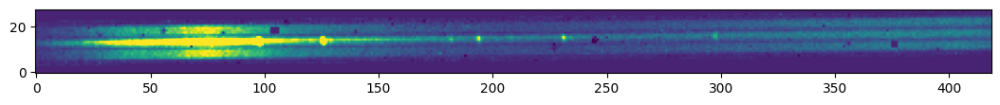

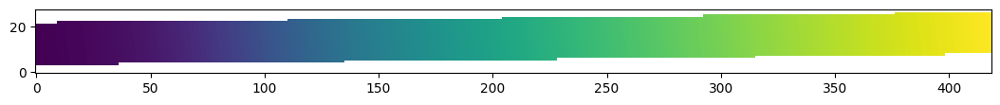

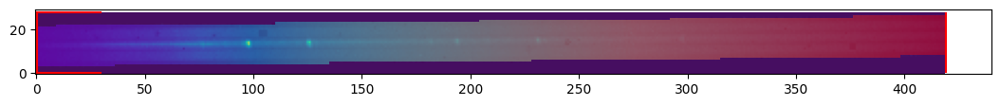

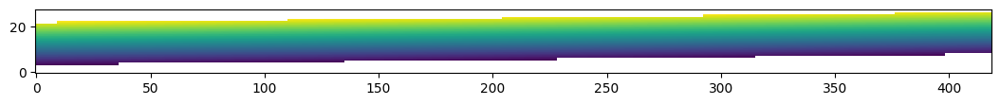

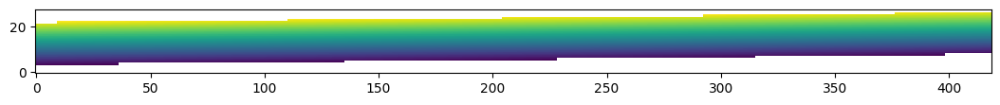

...

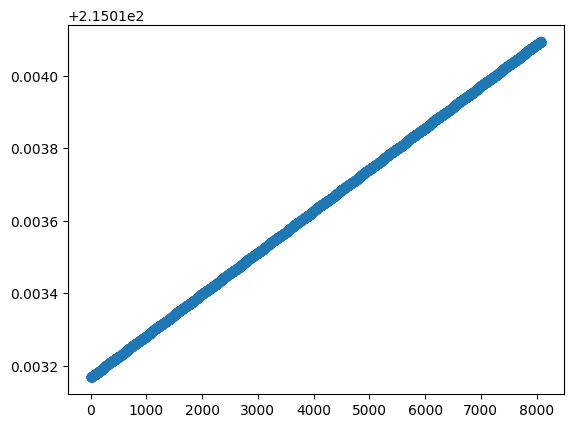

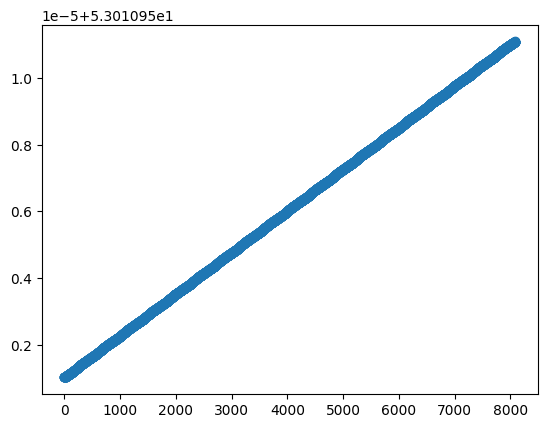

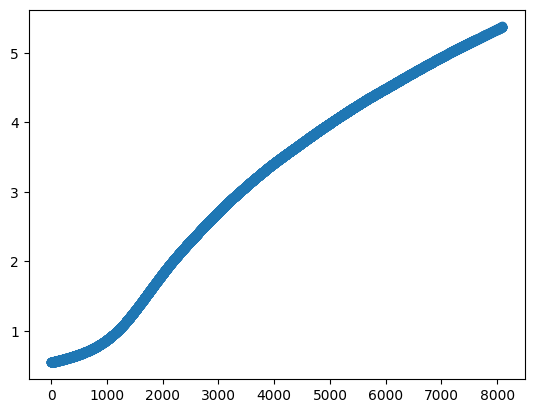

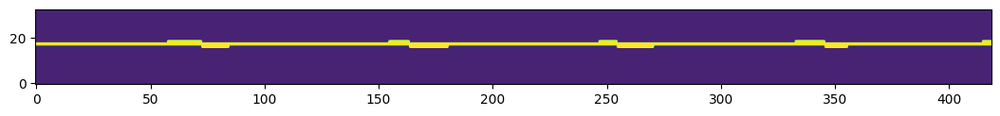

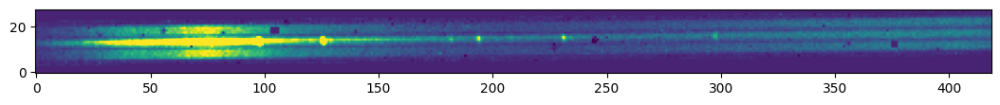

In [257]:
for slit in slits.slits:
    if slit.source_id == 10318:
        plt.figure(figsize=(13,5))
        z = ZScaleInterval()
        z1,z2 = z.get_limits(slit.data)
        plt.imshow(slit.data,origin="lower",vmin=z1,vmax=z2)
        
        plt.figure(figsize=(13,5))
        plt.imshow(slit.wavelength,origin='lower')
        
        plt.figure(figsize=(13,5))
        plt.imshow(slit.data,origin="lower")
        plt.imshow(slit.wavelength,origin='lower',cmap='rainbow',alpha=0.4)
        
        plt.hlines([slit.source_ypos,slit.ysize],0,30,color='r')
        plt.vlines([slit.source_xpos,slit.xsize],0,28,color='r')
        
        plt.figure(figsize=(13,5))
        Y,X = np.indices(slit.data.shape)
        ra,dec,lamb = slit.meta.wcs.transform('detector', 'world', X, Y)
        
        plt.imshow(ra,origin='lower')
        
        plt.figure(figsize=(13,5))
        plt.imshow(dec,origin='lower')
        
        print(slit.shutter_state,slit.slit_ymax,slit.slit_ymin,slit.slitlet_id)
        print(slit.ycen,slit.ystart,slit.source_ypos,slit.ysize)
        print(slit.xcen,slit.xstart,slit.source_xpos,slit.xsize)
        
        data = slit.data
        
        eps = 0.2 / 3600
        distance = np.sqrt((slit.source_dec-dec)**2 + (slit.source_ra-ra)**2)
        distance[np.isnan(distance)] = 1000
        
        mask = np.logical_not(np.isnan(slit.wavelength))
        mask = np.logical_and(mask,distance > eps)
        
        
        plt.figure(figsize=(13,5))
        plt.imshow(data,origin='lower')
        plt.imshow(mask,alpha=0.2,origin='lower')
        
        plt.figure()
        plt.plot(np.unique(ra),marker='o')
        
        plt.figure()
        plt.plot(np.unique(dec),marker='o')
        
        plt.figure()
        plt.plot(np.unique(lamb),marker='o')
        
        
        mask = np.logical_and(
            np.logical_not(np.isnan(slit.wavelength)),
            distance < eps
        )
        y,x = np.where(mask)
        
        coeff, err = cfit(f,x,y)
        print(coeff,err)
        alpha = np.arctan(coeff[0])*180/np.pi
        print(alpha)
        
        lamb[np.isnan(lamb)] = 0
        
        rotated = rotate(mask,alpha,mode='nearest')
        
        plt.figure(figsize=(13,5))
        plt.imshow(rotated,origin='lower',vmin=z1,vmax=z2)
        
        plt.figure(figsize=(13,5))
        plt.imshow(slit.data,origin='lower',vmin=z1,vmax=z2)
        print(np.where(np.isnan(slit.data)))

        
def f(x,a,b):
    return x * a + b
        

(array([], dtype=int64), array([], dtype=int64))


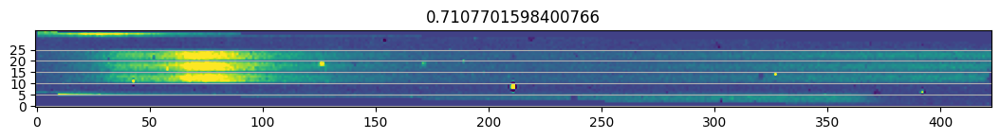

(array([], dtype=int64), array([], dtype=int64))


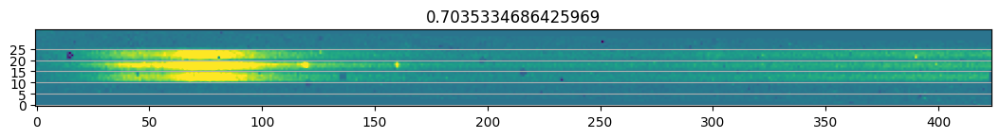

(array([], dtype=int64), array([], dtype=int64))


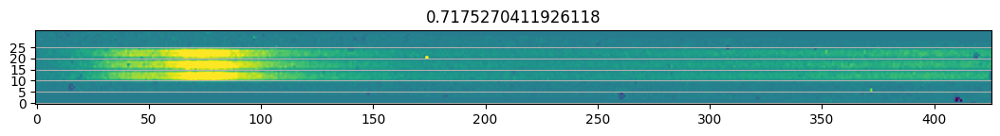

(array([], dtype=int64), array([], dtype=int64))


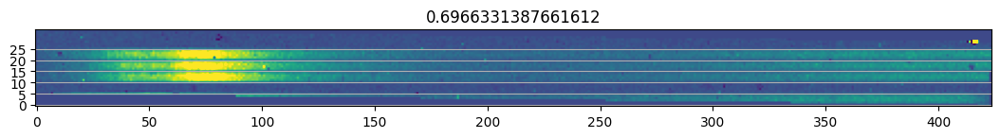

(array([], dtype=int64), array([], dtype=int64))


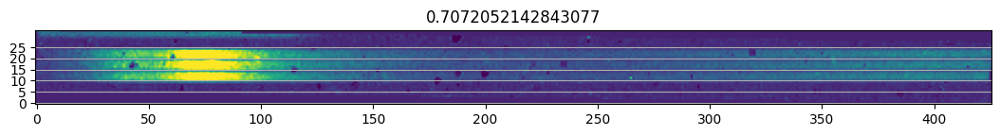

(array([], dtype=int64), array([], dtype=int64))


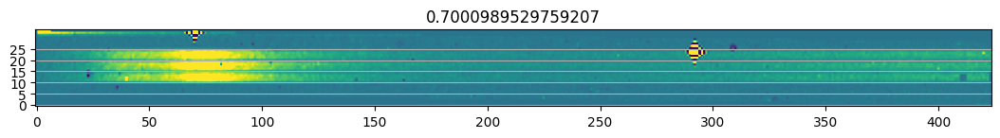

(array([], dtype=int64), array([], dtype=int64))


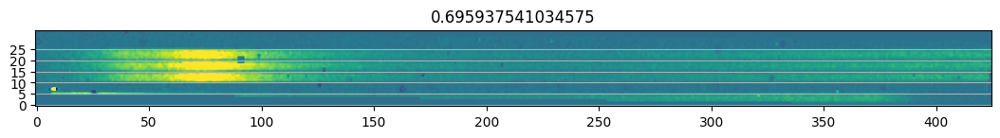

(array([], dtype=int64), array([], dtype=int64))


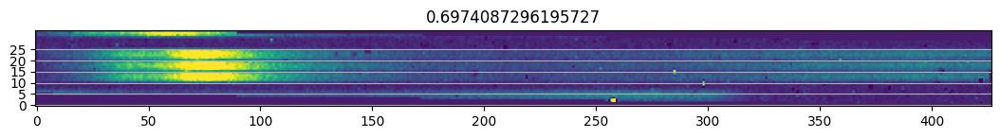

(array([], dtype=int64), array([], dtype=int64))


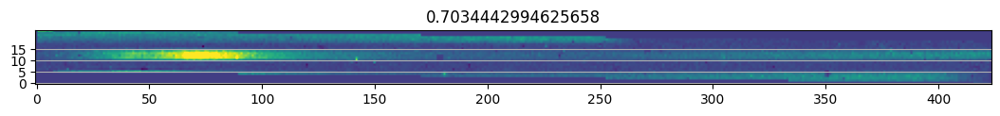

(array([], dtype=int64), array([], dtype=int64))


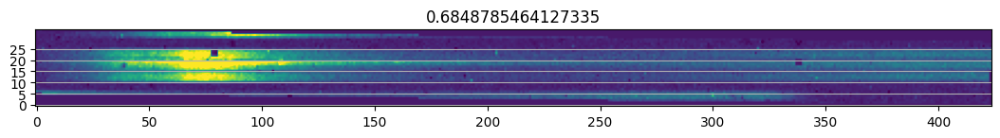

(array([], dtype=int64), array([], dtype=int64))


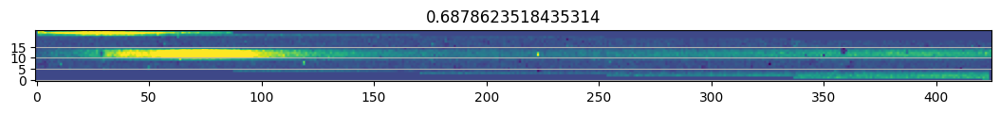

(array([], dtype=int64), array([], dtype=int64))


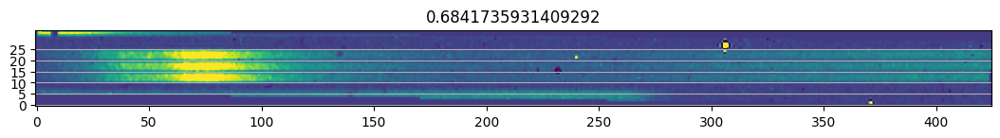

(array([], dtype=int64), array([], dtype=int64))


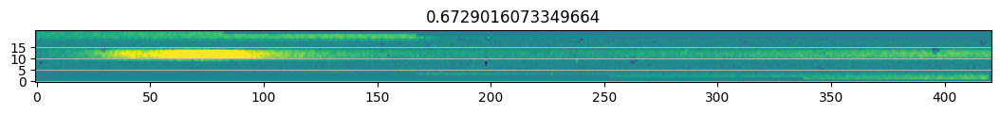

(array([], dtype=int64), array([], dtype=int64))


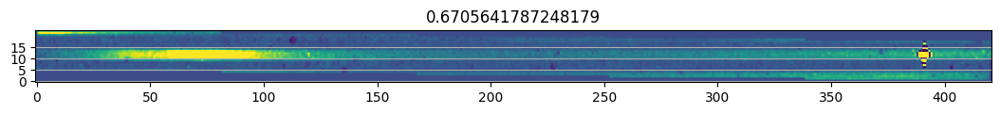

(array([], dtype=int64), array([], dtype=int64))


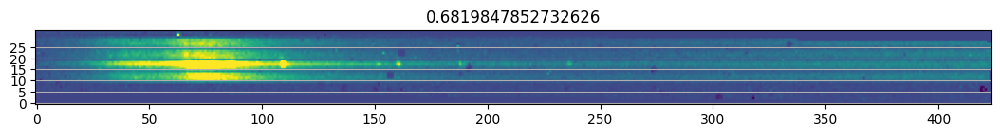

(array([], dtype=int64), array([], dtype=int64))


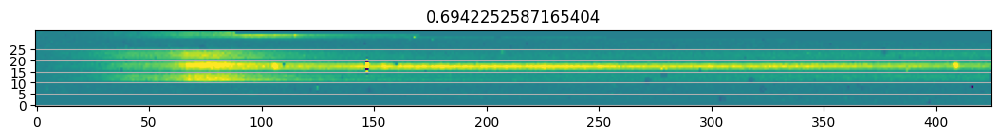

(array([], dtype=int64), array([], dtype=int64))


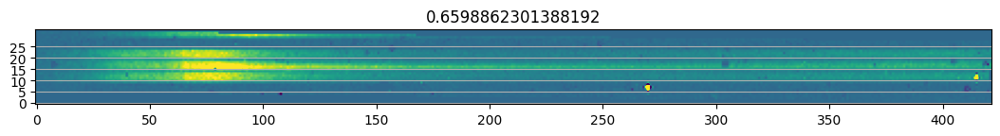

(array([], dtype=int64), array([], dtype=int64))


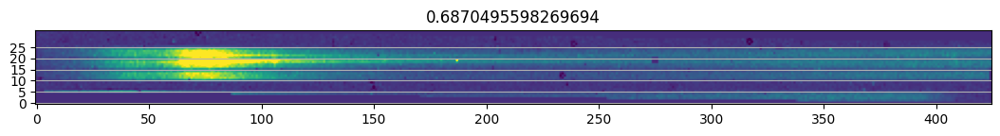

(array([], dtype=int64), array([], dtype=int64))


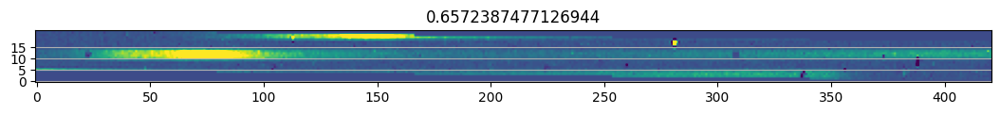

(array([], dtype=int64), array([], dtype=int64))


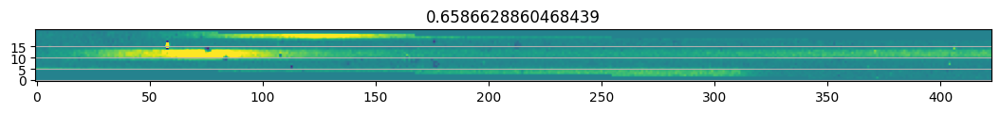

(array([], dtype=int64), array([], dtype=int64))


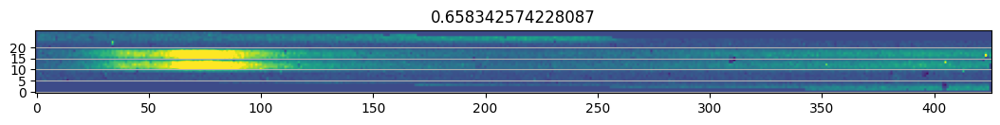

(array([], dtype=int64), array([], dtype=int64))


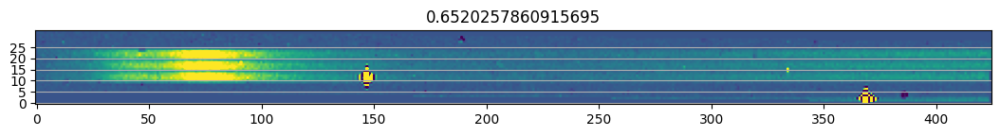

(array([], dtype=int64), array([], dtype=int64))


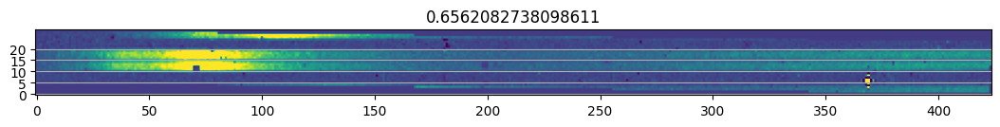

(array([], dtype=int64), array([], dtype=int64))


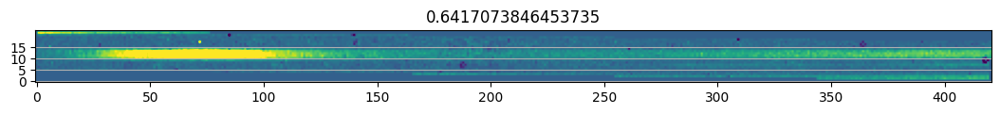

(array([], dtype=int64), array([], dtype=int64))


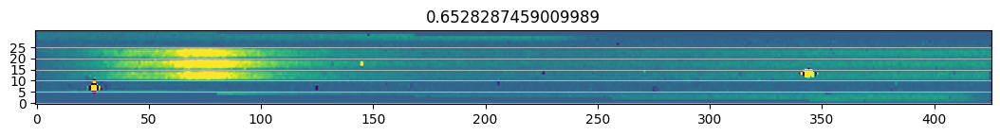

(array([], dtype=int64), array([], dtype=int64))


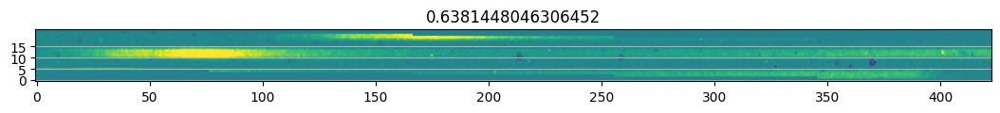

(array([], dtype=int64), array([], dtype=int64))


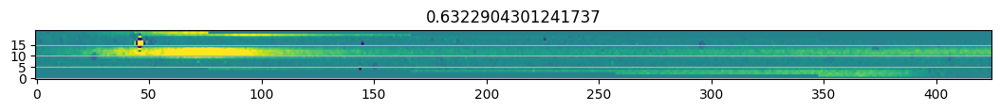

(array([], dtype=int64), array([], dtype=int64))


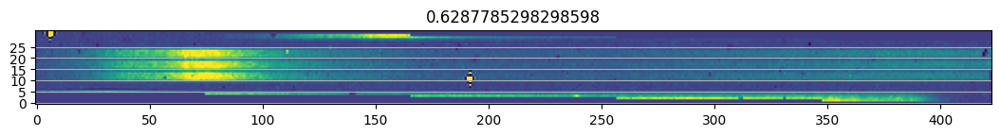

(array([], dtype=int64), array([], dtype=int64))


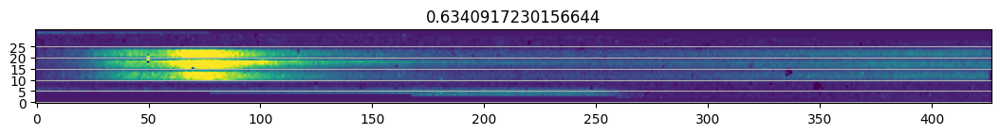

(array([], dtype=int64), array([], dtype=int64))


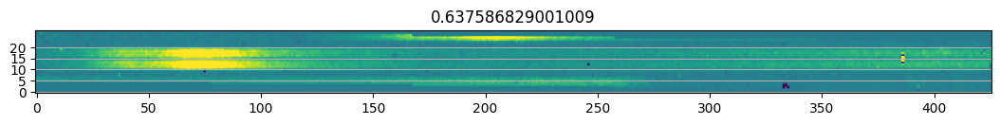

(array([], dtype=int64), array([], dtype=int64))


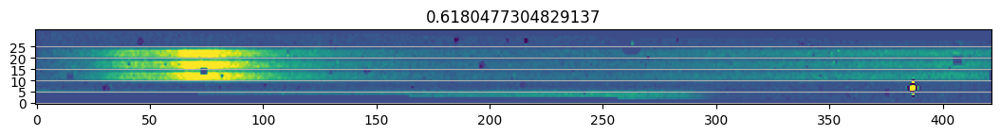

(array([], dtype=int64), array([], dtype=int64))


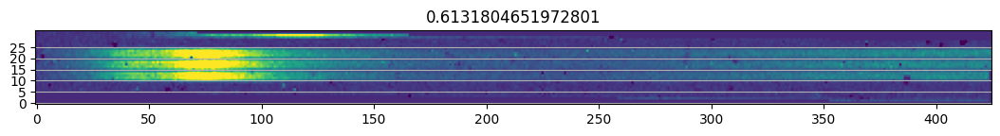

(array([], dtype=int64), array([], dtype=int64))


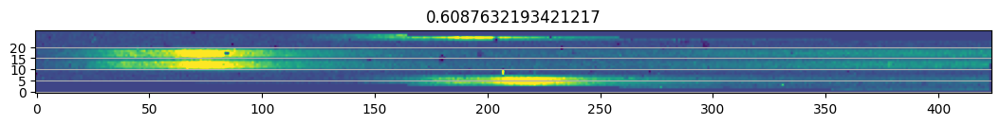

(array([], dtype=int64), array([], dtype=int64))


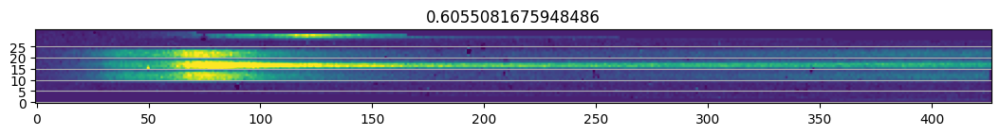

(array([], dtype=int64), array([], dtype=int64))


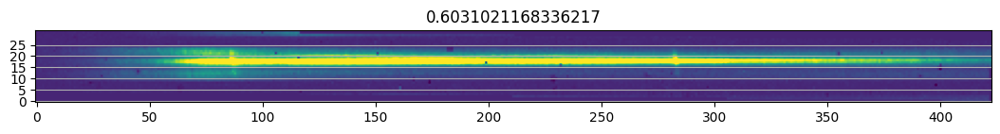

(array([], dtype=int64), array([], dtype=int64))


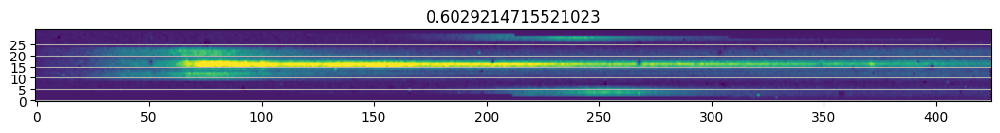

(array([], dtype=int64), array([], dtype=int64))


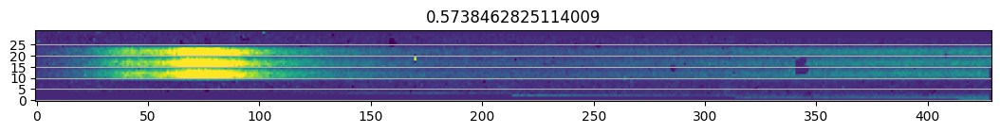

(array([], dtype=int64), array([], dtype=int64))


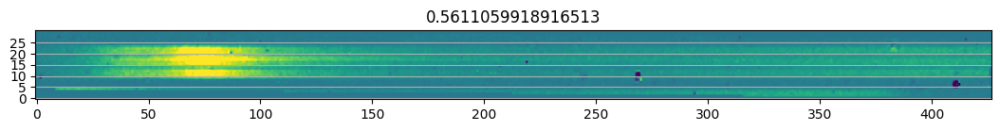

(array([], dtype=int64), array([], dtype=int64))


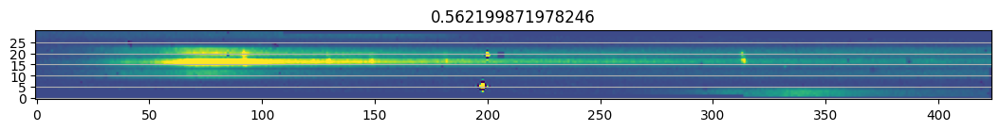

(array([], dtype=int64), array([], dtype=int64))


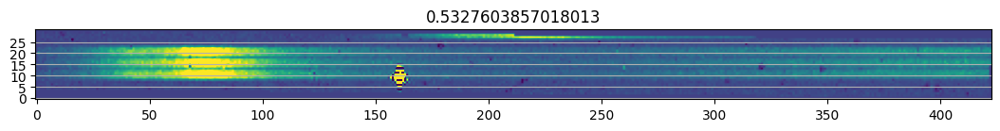

(array([], dtype=int64), array([], dtype=int64))


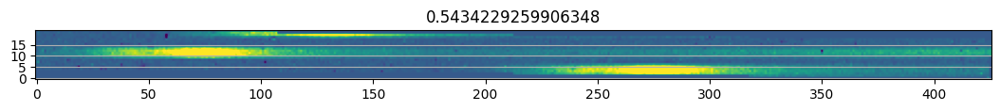

(array([], dtype=int64), array([], dtype=int64))


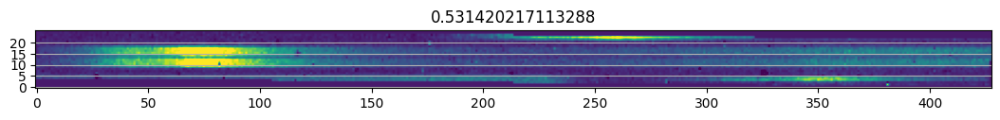

(array([], dtype=int64), array([], dtype=int64))


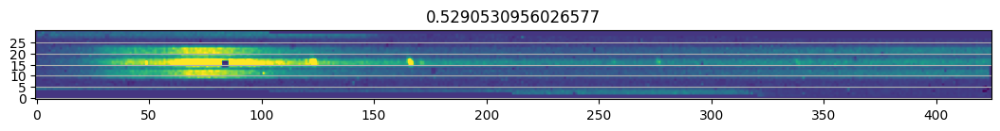

(array([], dtype=int64), array([], dtype=int64))


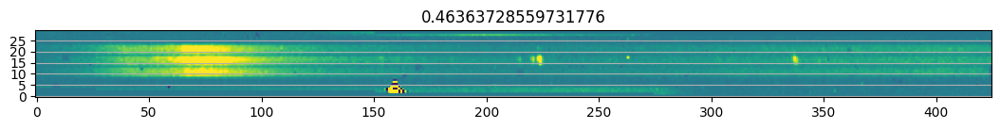

(array([], dtype=int64), array([], dtype=int64))


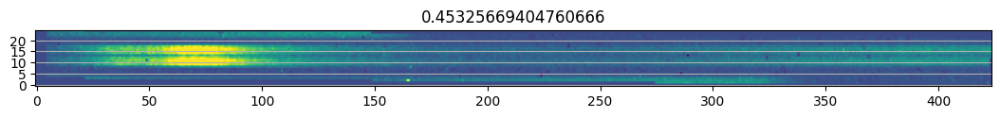

(array([], dtype=int64), array([], dtype=int64))


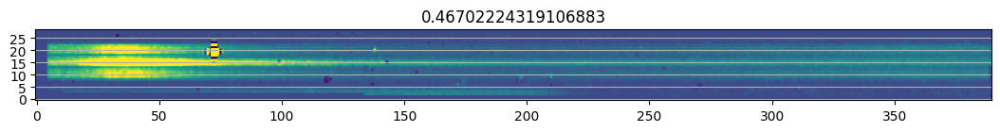

(array([], dtype=int64), array([], dtype=int64))


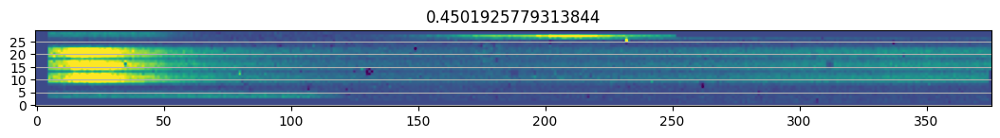

(array([], dtype=int64), array([], dtype=int64))


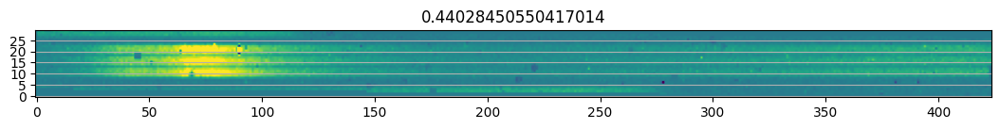

(array([], dtype=int64), array([], dtype=int64))


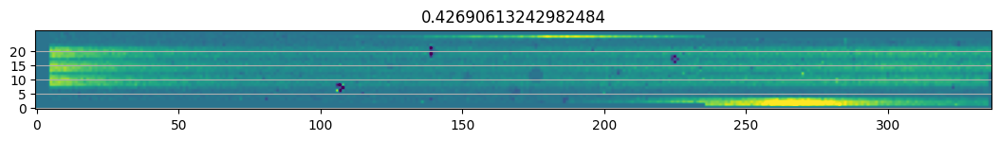

(array([], dtype=int64), array([], dtype=int64))


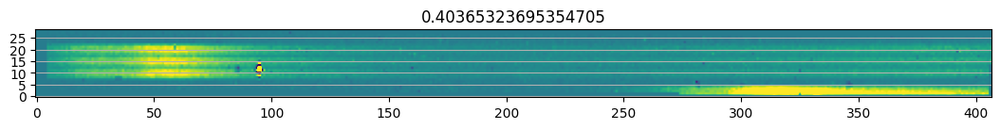

(array([], dtype=int64), array([], dtype=int64))


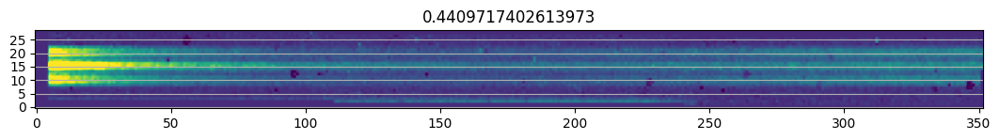

(array([], dtype=int64), array([], dtype=int64))


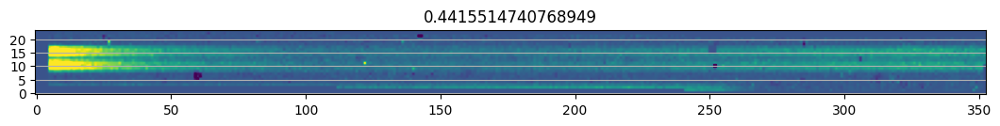

(array([], dtype=int64), array([], dtype=int64))


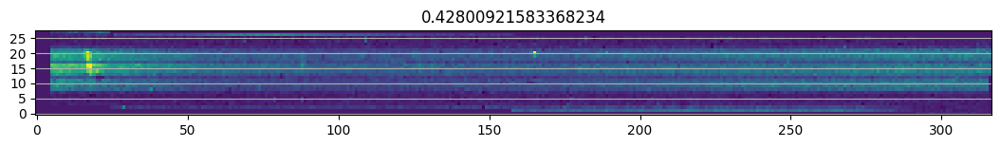

(array([], dtype=int64), array([], dtype=int64))


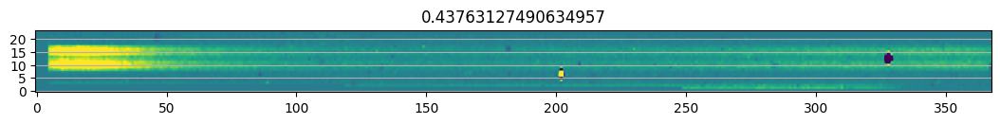

(array([], dtype=int64), array([], dtype=int64))


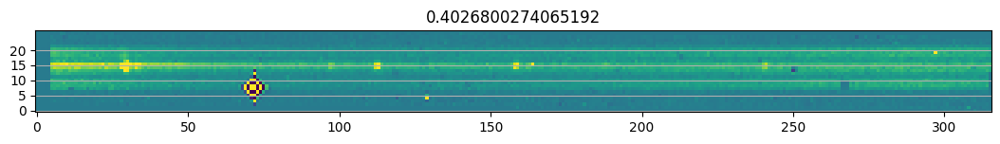

(array([], dtype=int64), array([], dtype=int64))


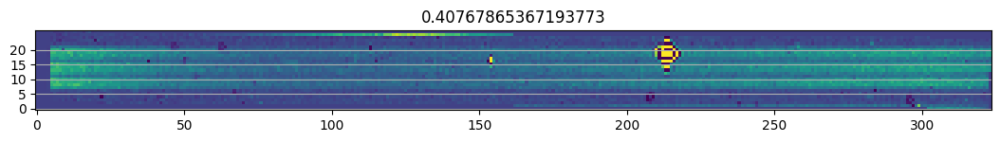

(array([], dtype=int64), array([], dtype=int64))


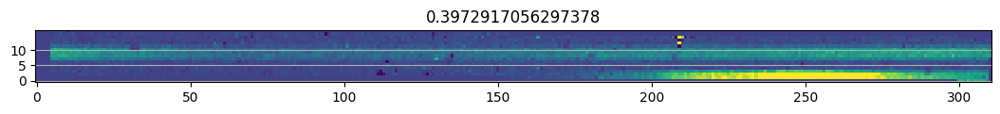

(array([], dtype=int64), array([], dtype=int64))


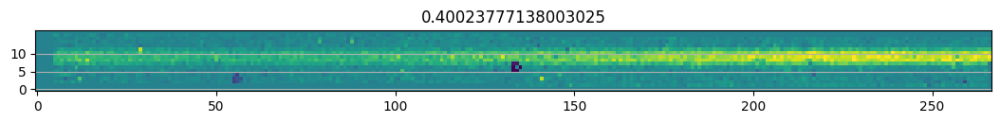

(array([], dtype=int64), array([], dtype=int64))


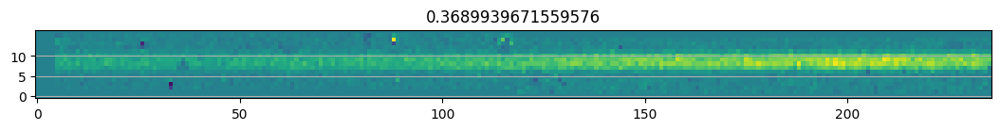

(array([], dtype=int64), array([], dtype=int64))


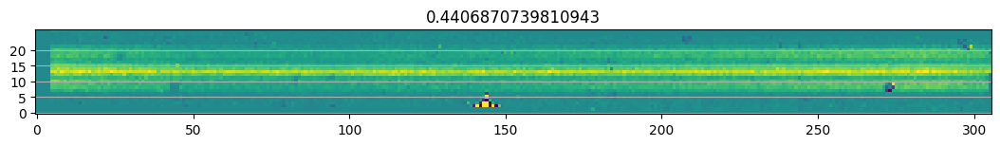

(array([], dtype=int64), array([], dtype=int64))


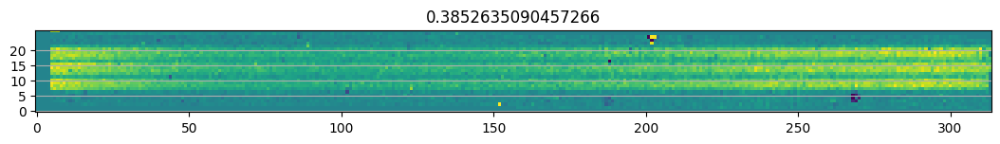

(array([], dtype=int64), array([], dtype=int64))


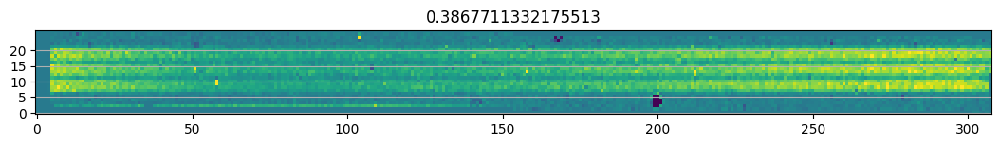

(array([], dtype=int64), array([], dtype=int64))


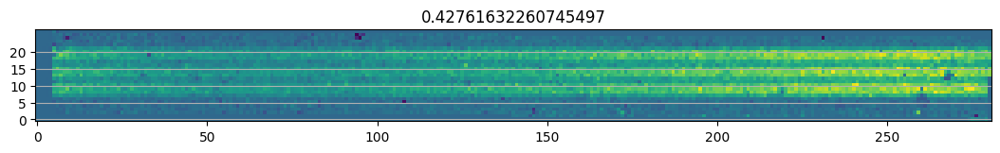

(array([], dtype=int64), array([], dtype=int64))


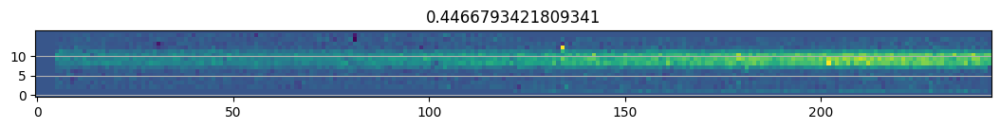

(array([], dtype=int64), array([], dtype=int64))


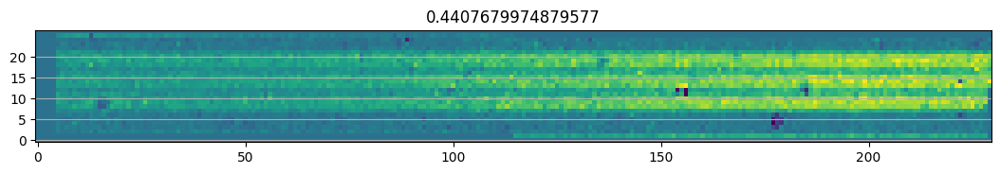

(array([], dtype=int64), array([], dtype=int64))


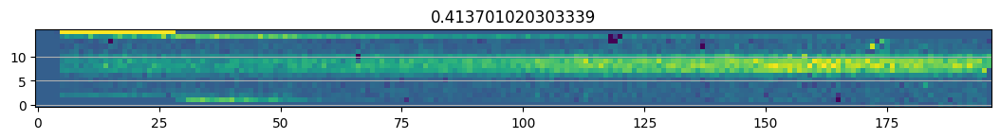

(array([], dtype=int64), array([], dtype=int64))


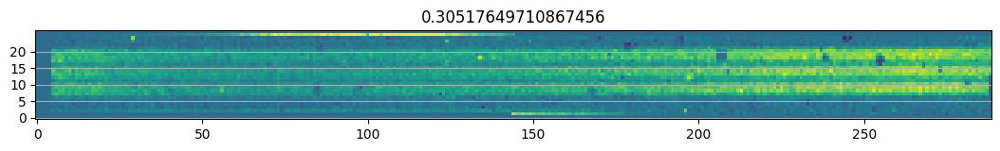

(array([], dtype=int64), array([], dtype=int64))


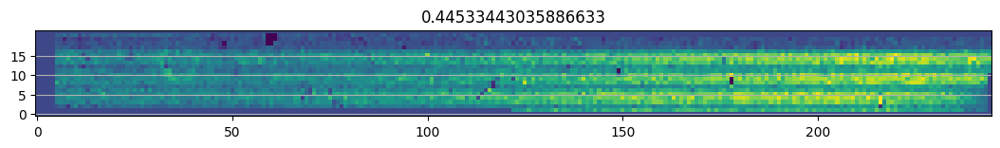

(array([], dtype=int64), array([], dtype=int64))


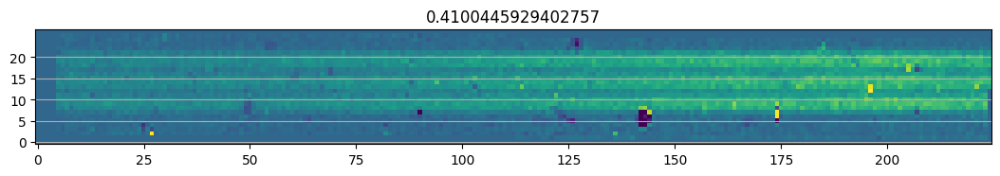

(array([], dtype=int64), array([], dtype=int64))


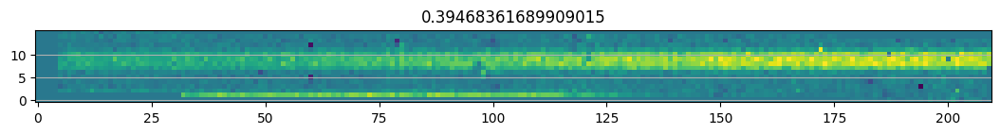

(array([], dtype=int64), array([], dtype=int64))


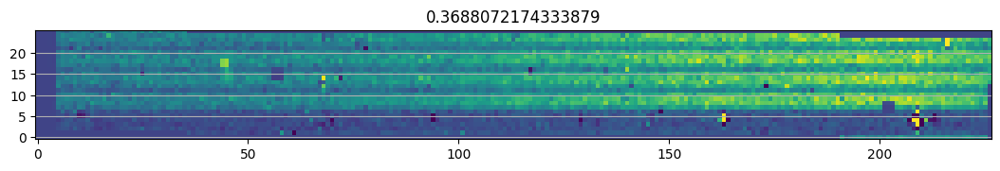

(array([], dtype=int64), array([], dtype=int64))


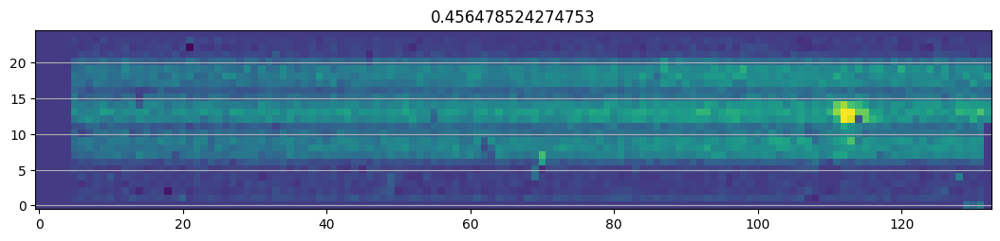

(array([], dtype=int64), array([], dtype=int64))


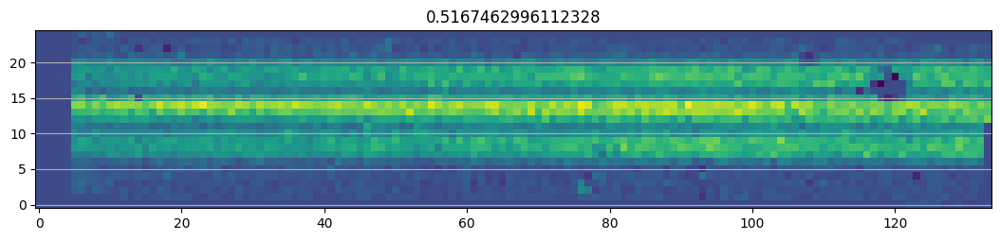

(array([], dtype=int64), array([], dtype=int64))


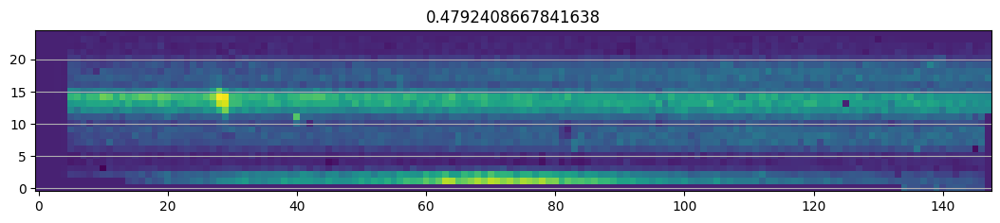

(array([], dtype=int64), array([], dtype=int64))


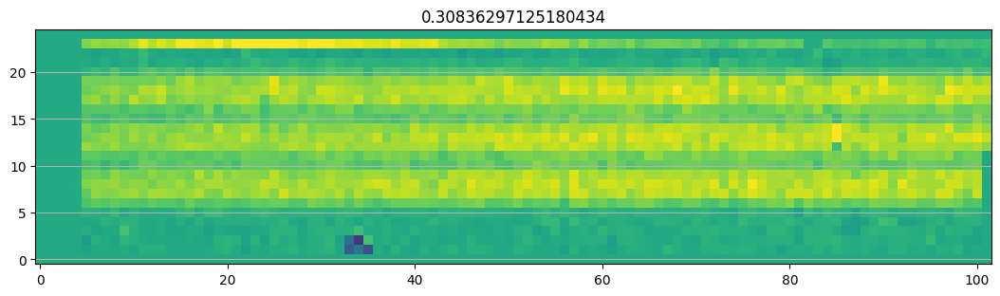

(array([], dtype=int64), array([], dtype=int64))


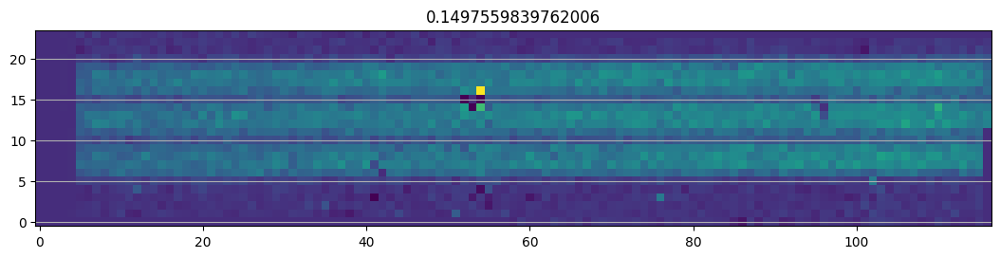

(array([], dtype=int64), array([], dtype=int64))


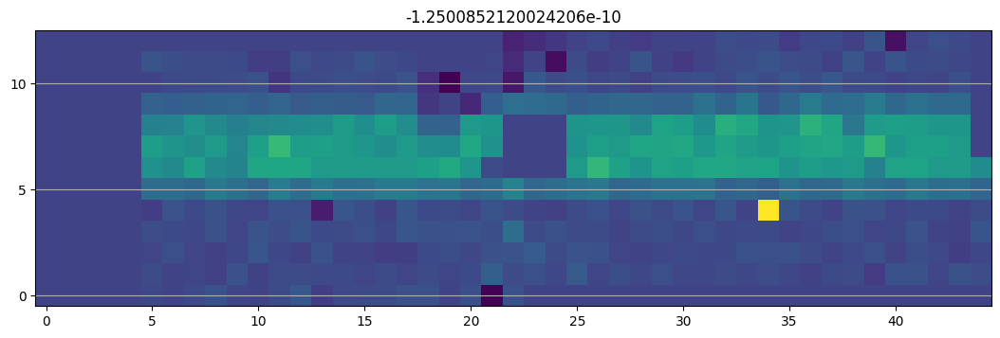

(array([], dtype=int64), array([], dtype=int64))


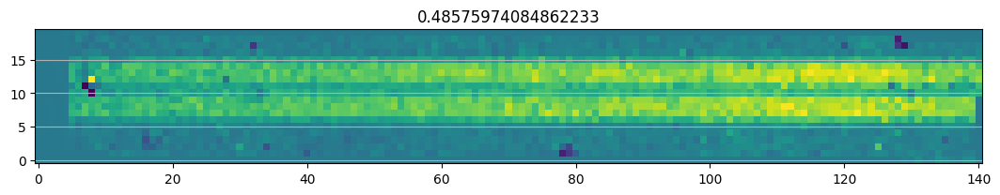

(array([], dtype=int64), array([], dtype=int64))


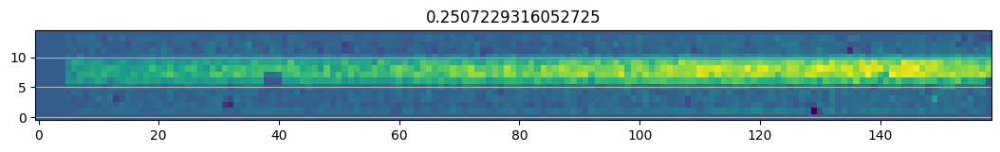

(array([], dtype=int64), array([], dtype=int64))


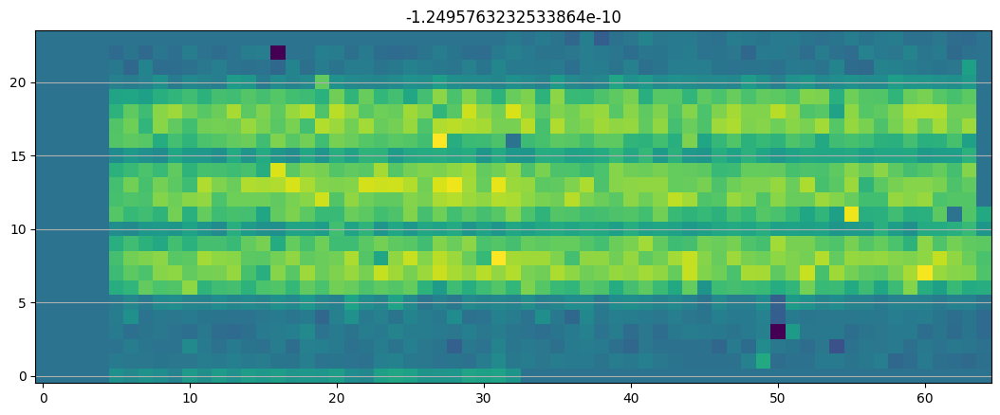

(array([], dtype=int64), array([], dtype=int64))


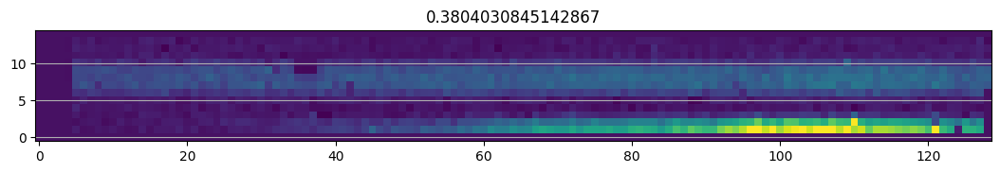

(array([], dtype=int64), array([], dtype=int64))


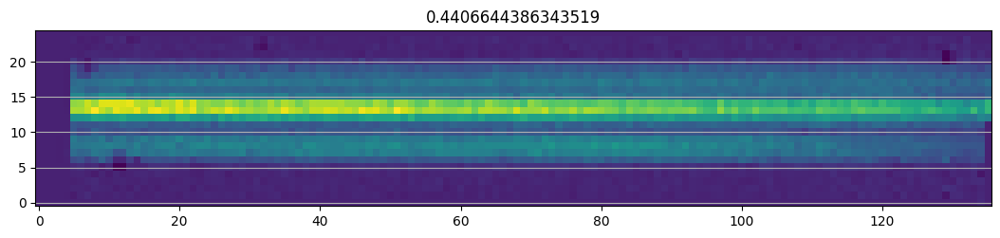

(array([], dtype=int64), array([], dtype=int64))


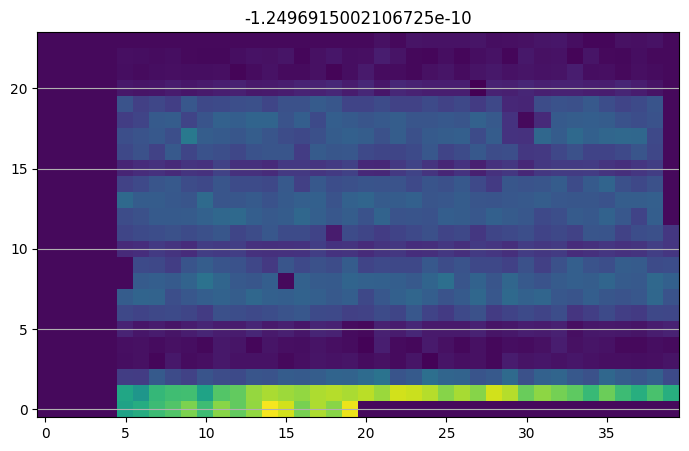

(array([], dtype=int64), array([], dtype=int64))


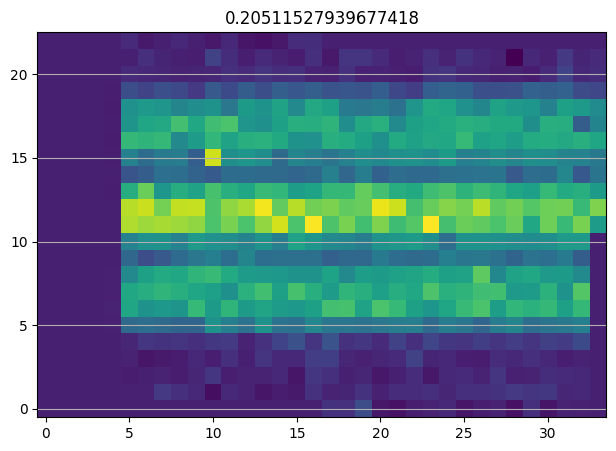

(array([], dtype=int64), array([], dtype=int64))


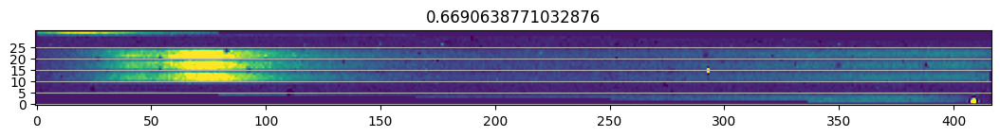

(array([], dtype=int64), array([], dtype=int64))


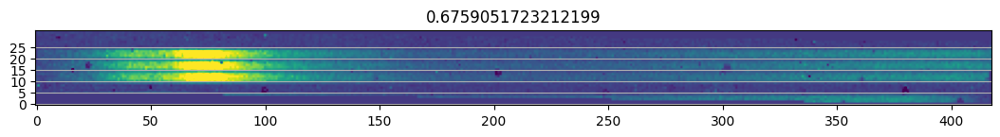

(array([], dtype=int64), array([], dtype=int64))


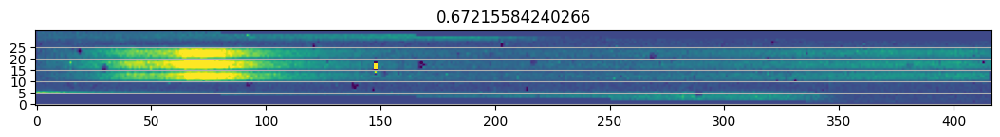

(array([], dtype=int64), array([], dtype=int64))


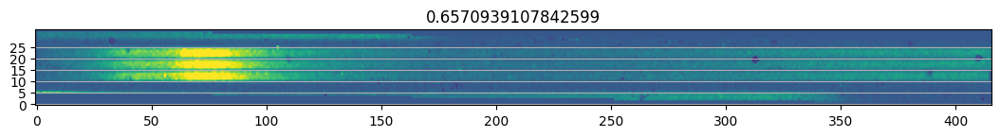

(array([], dtype=int64), array([], dtype=int64))


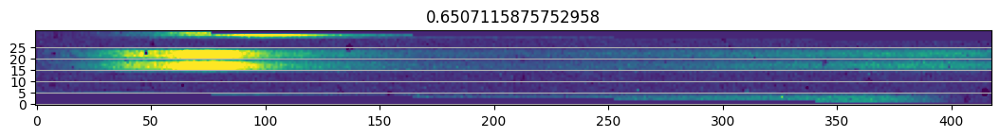

(array([], dtype=int64), array([], dtype=int64))


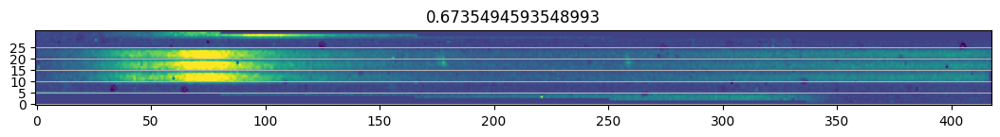

(array([], dtype=int64), array([], dtype=int64))


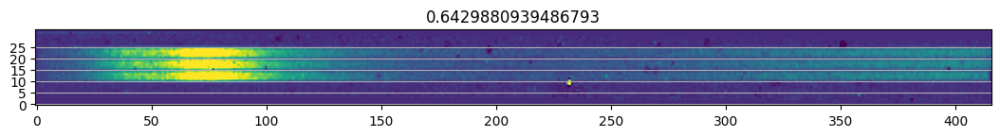

(array([], dtype=int64), array([], dtype=int64))


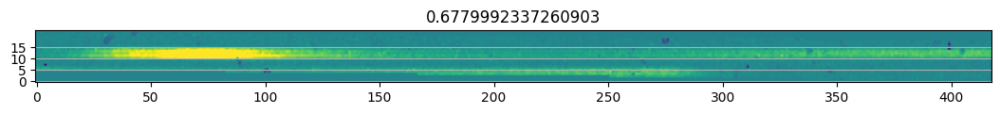

(array([], dtype=int64), array([], dtype=int64))


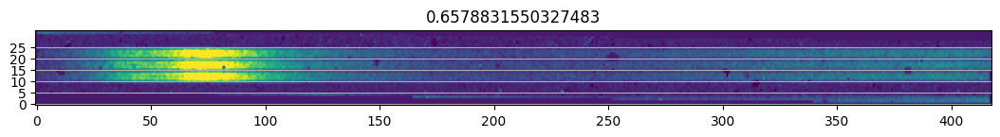

(array([], dtype=int64), array([], dtype=int64))


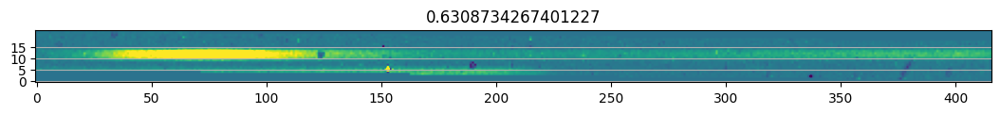

(array([], dtype=int64), array([], dtype=int64))


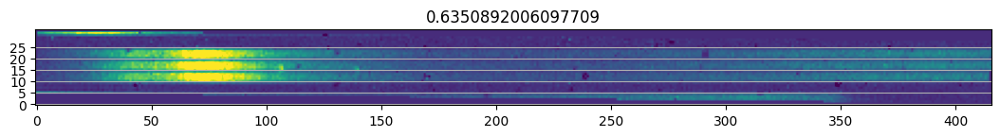

(array([], dtype=int64), array([], dtype=int64))


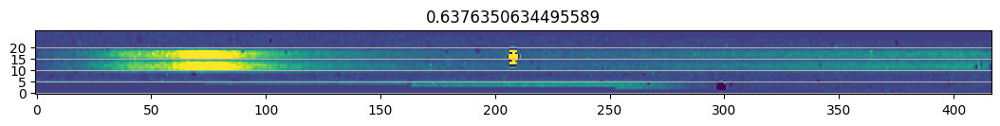

(array([], dtype=int64), array([], dtype=int64))


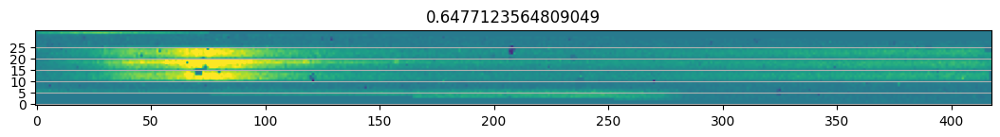

(array([], dtype=int64), array([], dtype=int64))


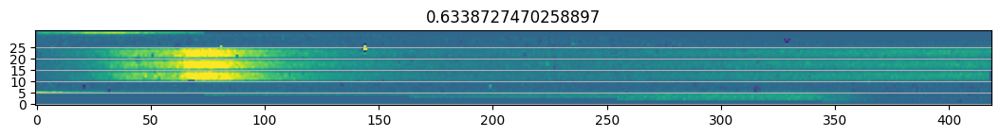

(array([], dtype=int64), array([], dtype=int64))


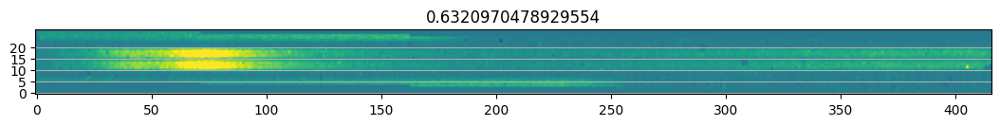

(array([], dtype=int64), array([], dtype=int64))


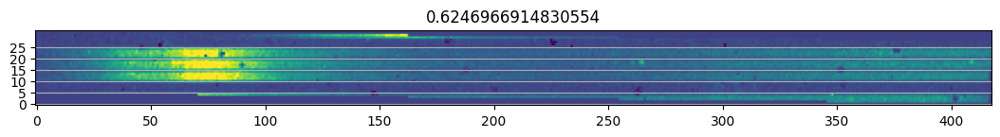

(array([], dtype=int64), array([], dtype=int64))


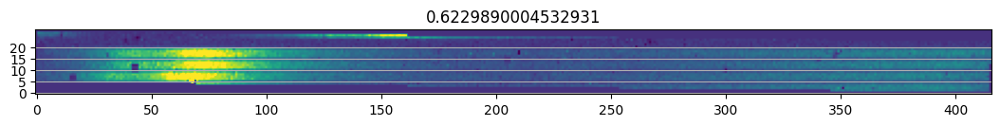

(array([], dtype=int64), array([], dtype=int64))


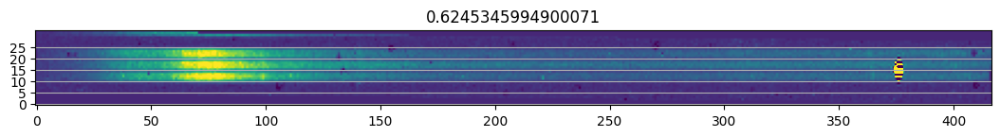

(array([], dtype=int64), array([], dtype=int64))


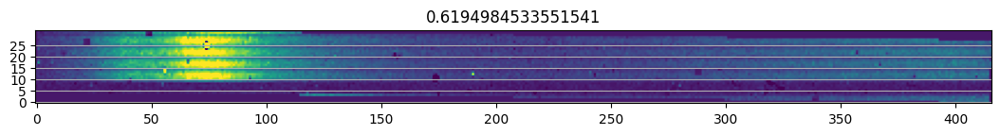

(array([], dtype=int64), array([], dtype=int64))


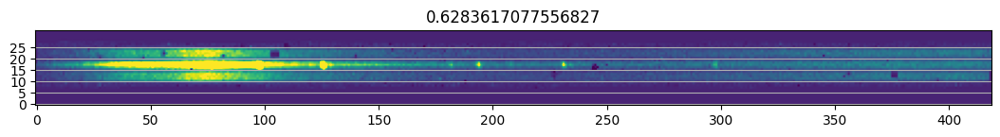

(array([], dtype=int64), array([], dtype=int64))


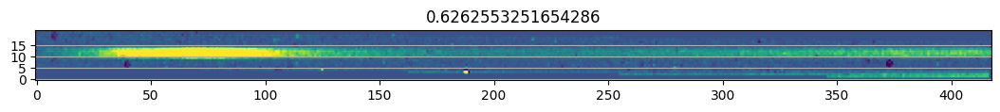

(array([], dtype=int64), array([], dtype=int64))


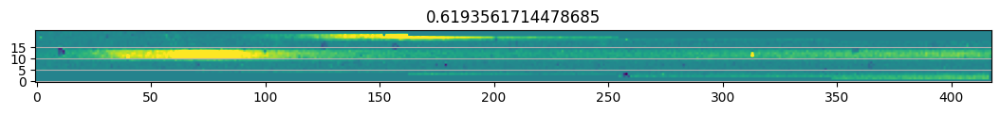

(array([], dtype=int64), array([], dtype=int64))


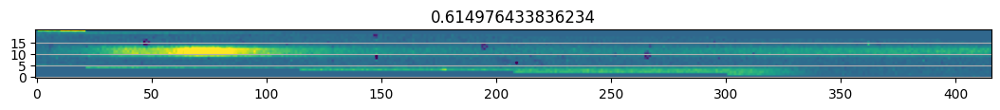

(array([], dtype=int64), array([], dtype=int64))


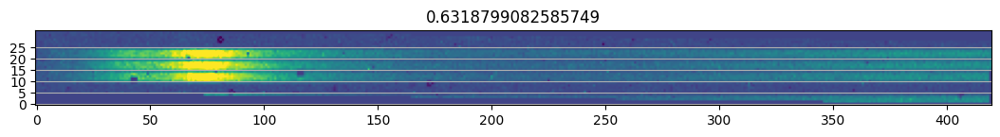

(array([], dtype=int64), array([], dtype=int64))


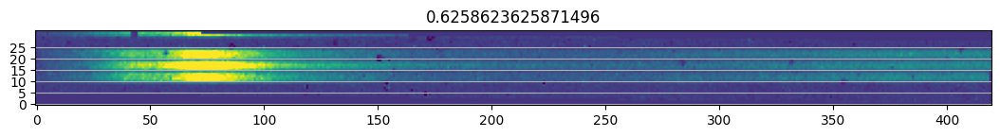

(array([], dtype=int64), array([], dtype=int64))


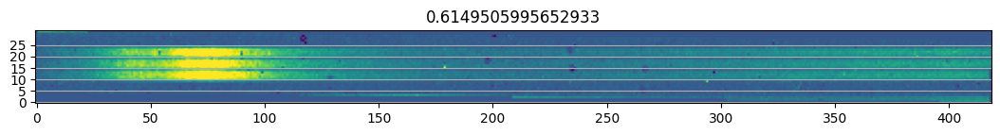

(array([], dtype=int64), array([], dtype=int64))


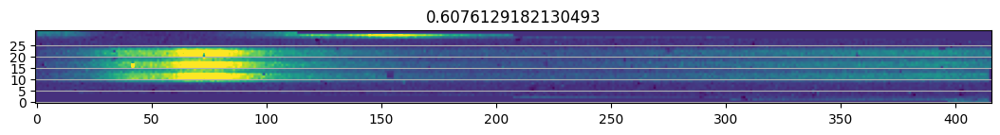

(array([], dtype=int64), array([], dtype=int64))


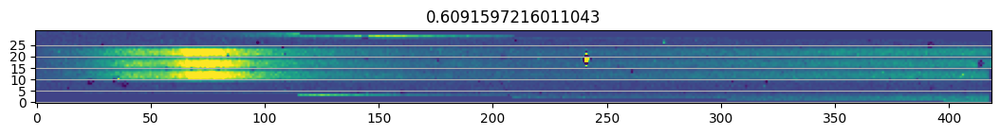

(array([], dtype=int64), array([], dtype=int64))


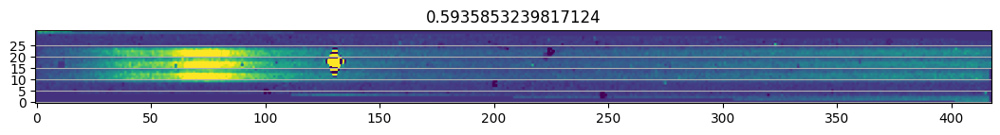

(array([], dtype=int64), array([], dtype=int64))


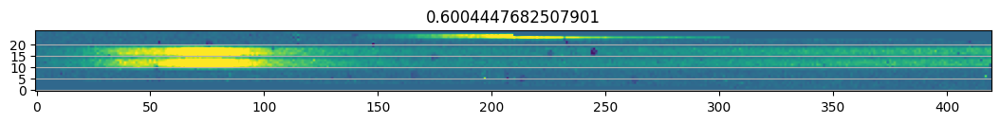

(array([], dtype=int64), array([], dtype=int64))


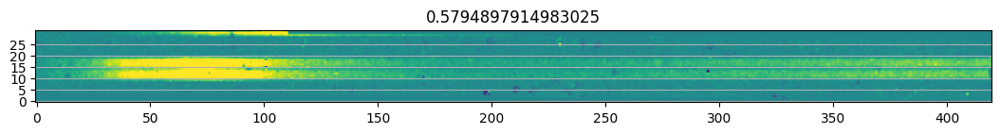

(array([], dtype=int64), array([], dtype=int64))


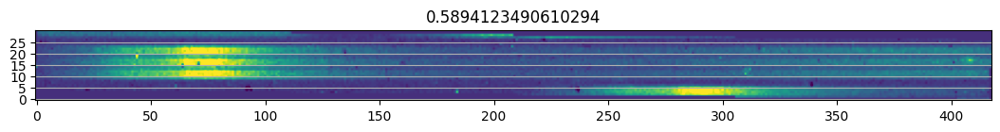

(array([], dtype=int64), array([], dtype=int64))


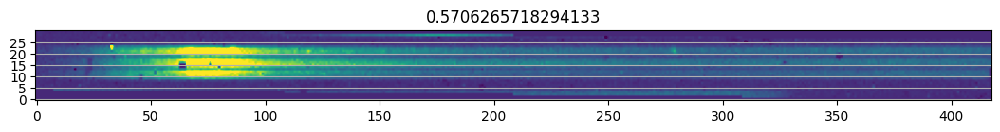

(array([], dtype=int64), array([], dtype=int64))


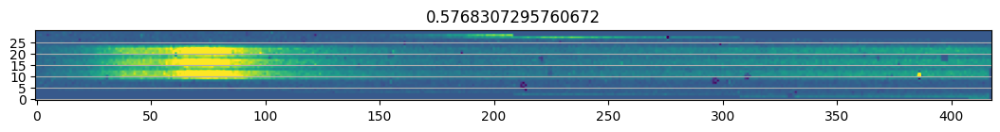

(array([], dtype=int64), array([], dtype=int64))


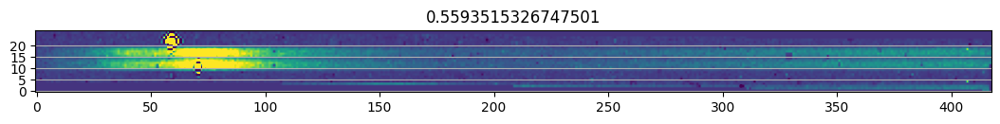

(array([], dtype=int64), array([], dtype=int64))


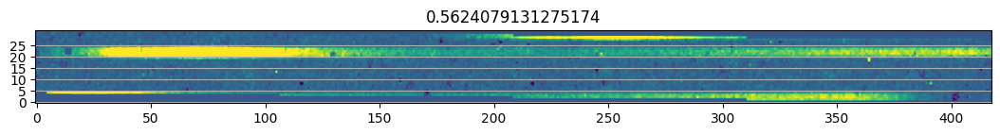

(array([], dtype=int64), array([], dtype=int64))


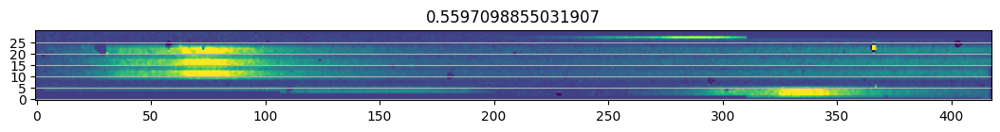

(array([], dtype=int64), array([], dtype=int64))


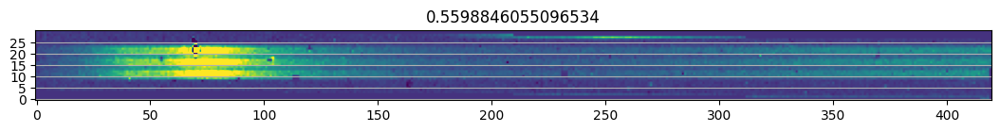

(array([], dtype=int64), array([], dtype=int64))


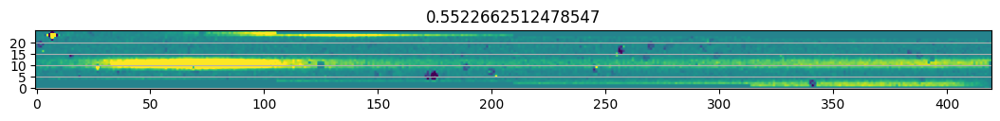

(array([], dtype=int64), array([], dtype=int64))


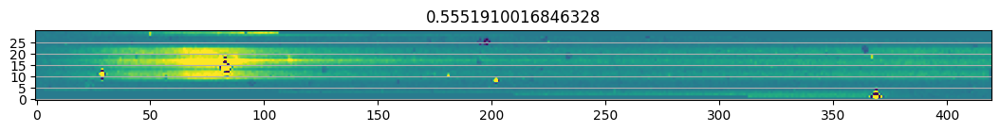

(array([], dtype=int64), array([], dtype=int64))


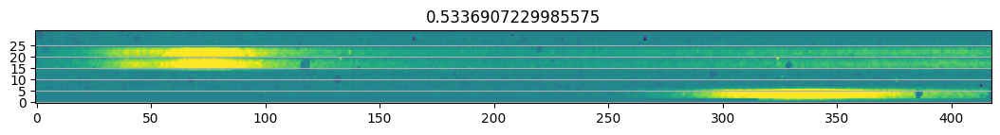

(array([], dtype=int64), array([], dtype=int64))


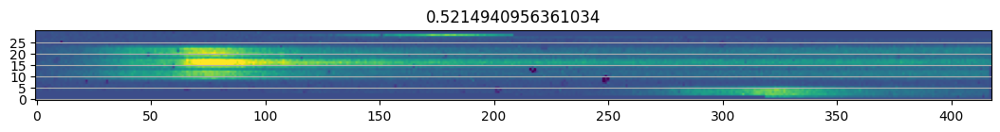

(array([], dtype=int64), array([], dtype=int64))


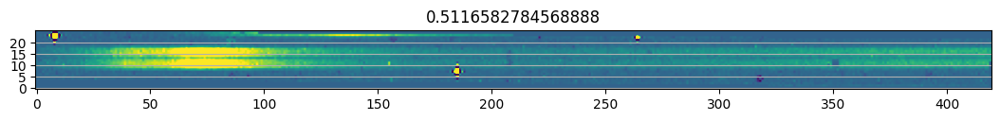

(array([], dtype=int64), array([], dtype=int64))


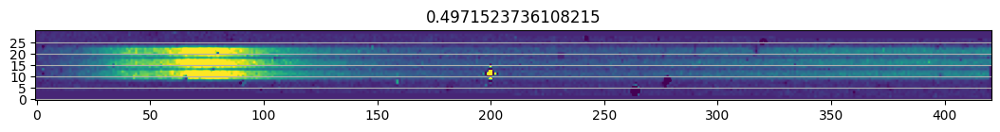

(array([], dtype=int64), array([], dtype=int64))


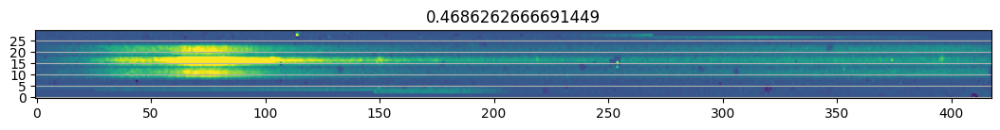

(array([], dtype=int64), array([], dtype=int64))


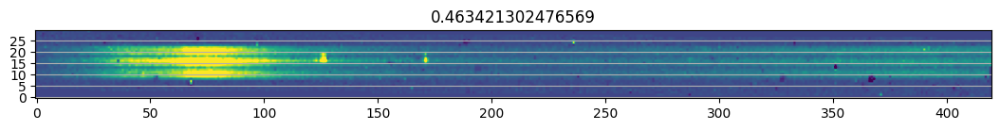

(array([], dtype=int64), array([], dtype=int64))


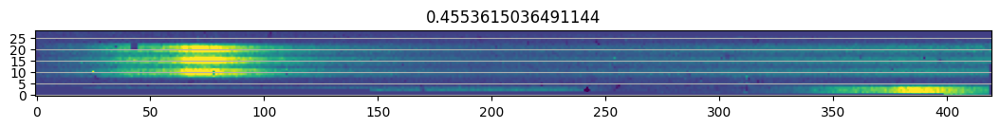

(array([], dtype=int64), array([], dtype=int64))


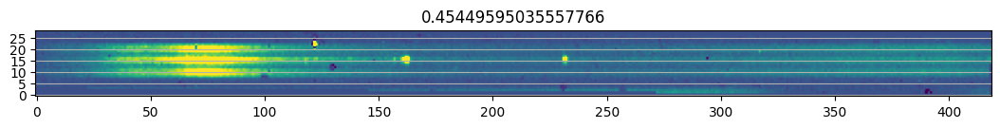

(array([], dtype=int64), array([], dtype=int64))


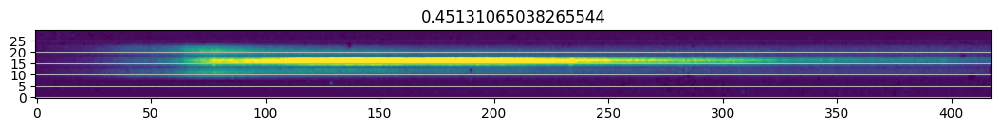

(array([], dtype=int64), array([], dtype=int64))


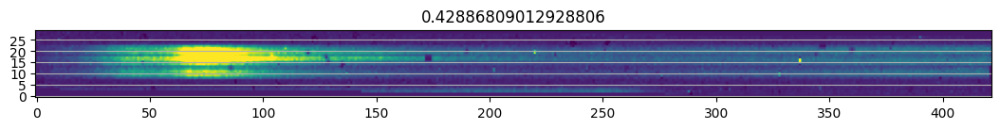

(array([], dtype=int64), array([], dtype=int64))


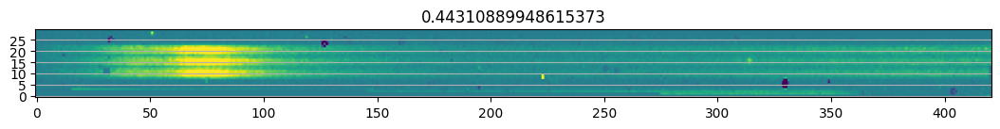

(array([], dtype=int64), array([], dtype=int64))


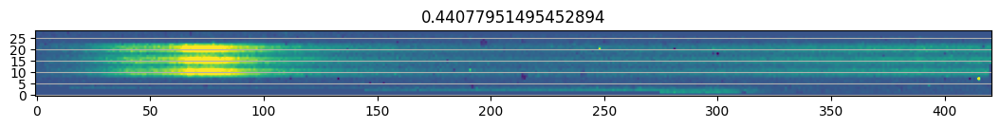

(array([], dtype=int64), array([], dtype=int64))


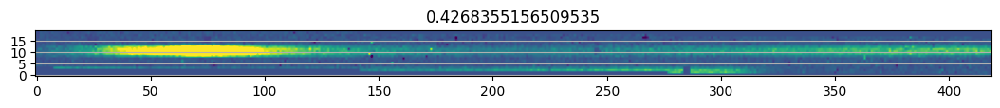

(array([], dtype=int64), array([], dtype=int64))


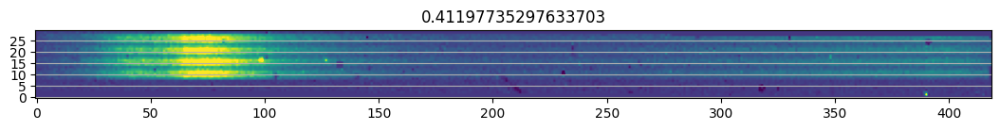

(array([], dtype=int64), array([], dtype=int64))


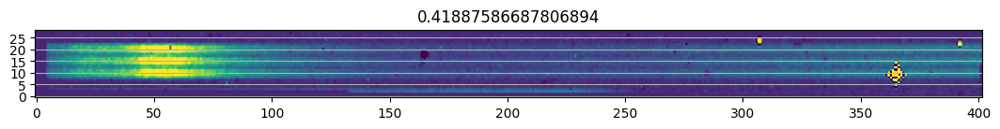

(array([], dtype=int64), array([], dtype=int64))


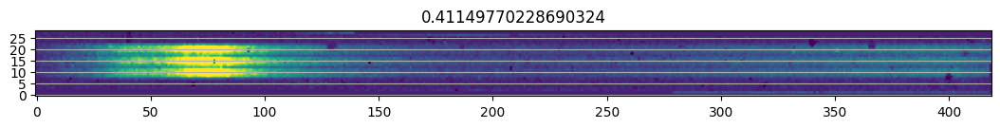

(array([], dtype=int64), array([], dtype=int64))


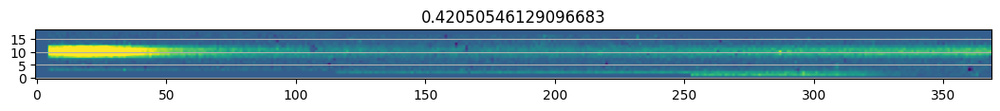

(array([], dtype=int64), array([], dtype=int64))


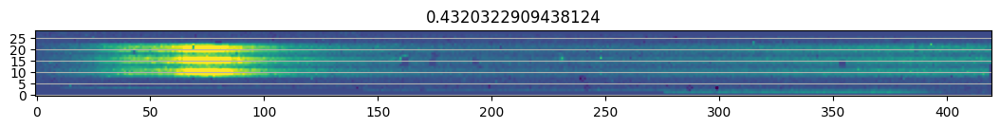

(array([], dtype=int64), array([], dtype=int64))


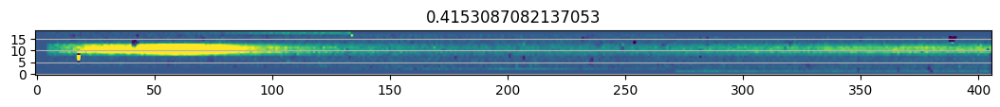

(array([], dtype=int64), array([], dtype=int64))


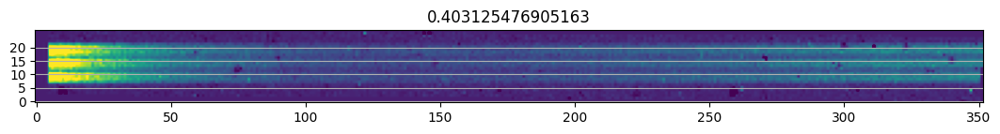

(array([], dtype=int64), array([], dtype=int64))


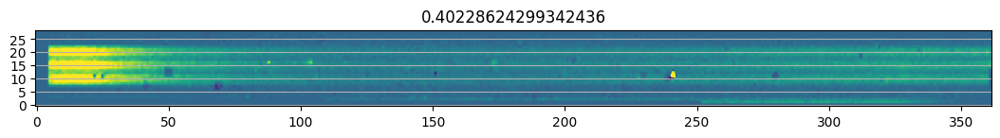

(array([], dtype=int64), array([], dtype=int64))


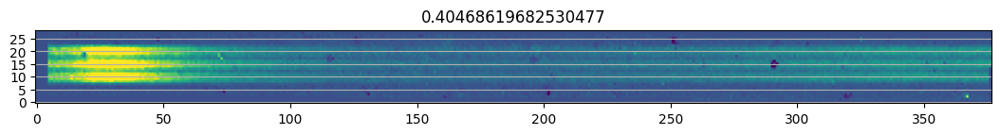

(array([], dtype=int64), array([], dtype=int64))


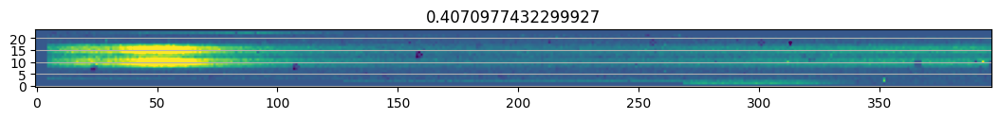

(array([], dtype=int64), array([], dtype=int64))


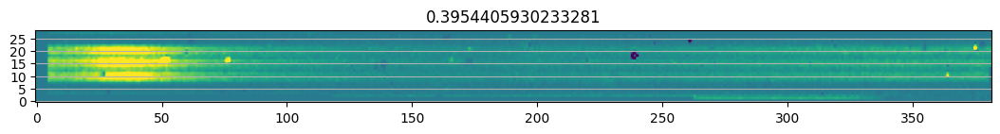

(array([], dtype=int64), array([], dtype=int64))


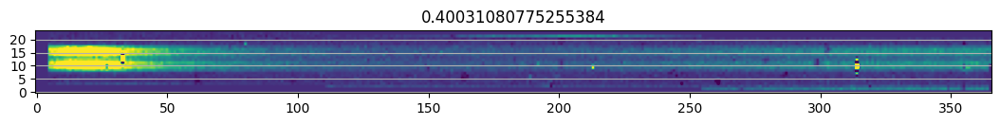

(array([], dtype=int64), array([], dtype=int64))


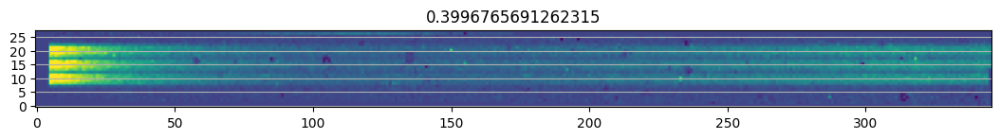

(array([], dtype=int64), array([], dtype=int64))


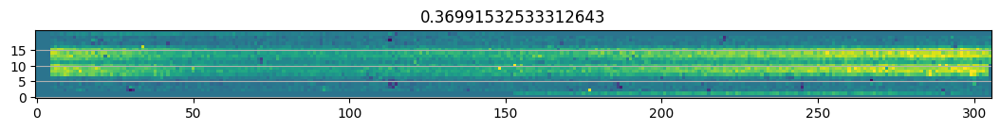

(array([], dtype=int64), array([], dtype=int64))


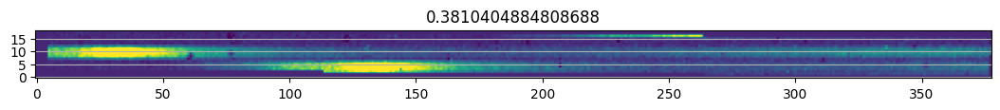

(array([], dtype=int64), array([], dtype=int64))


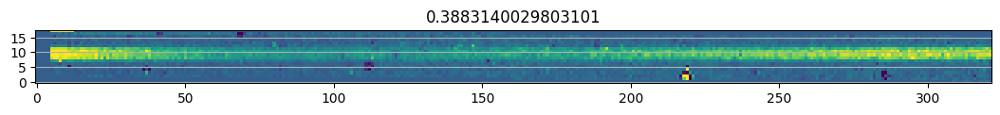

(array([], dtype=int64), array([], dtype=int64))


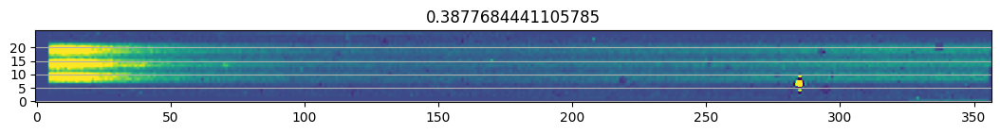

(array([], dtype=int64), array([], dtype=int64))


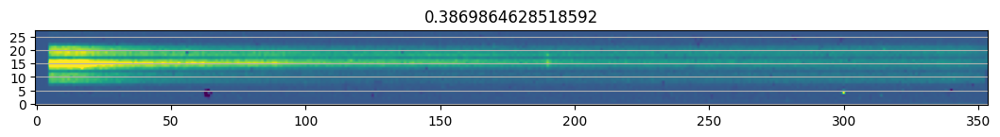

(array([], dtype=int64), array([], dtype=int64))


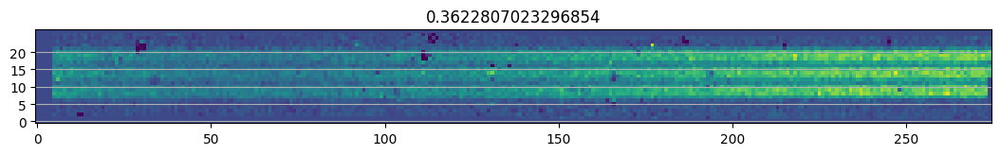

(array([], dtype=int64), array([], dtype=int64))


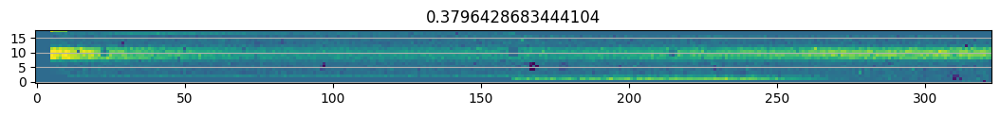

(array([], dtype=int64), array([], dtype=int64))


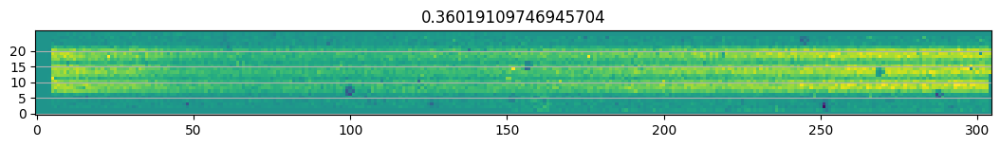

(array([], dtype=int64), array([], dtype=int64))


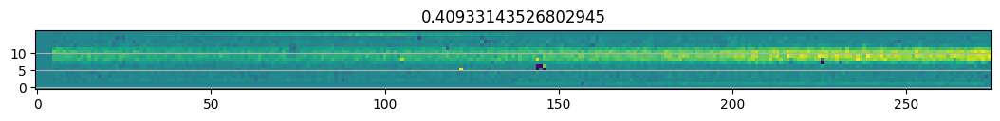

(array([], dtype=int64), array([], dtype=int64))


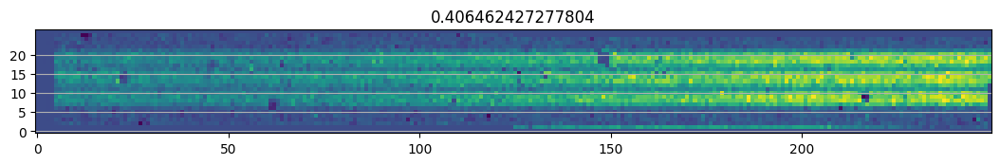

(array([], dtype=int64), array([], dtype=int64))


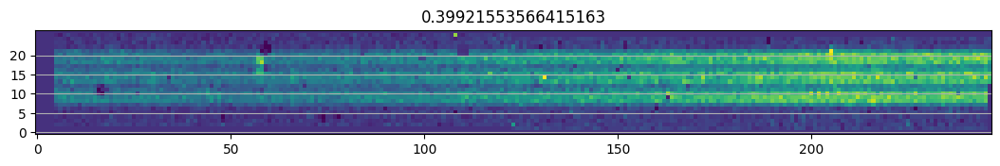

(array([], dtype=int64), array([], dtype=int64))


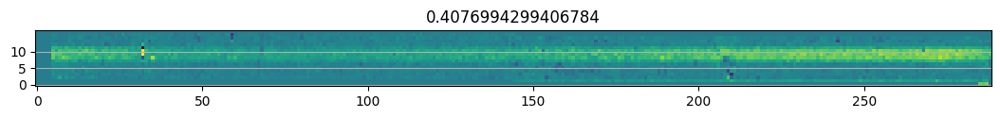

(array([], dtype=int64), array([], dtype=int64))


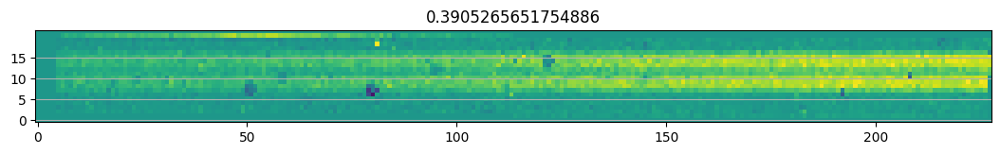

(array([], dtype=int64), array([], dtype=int64))


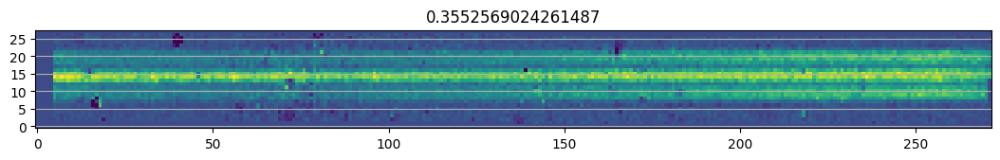

(array([], dtype=int64), array([], dtype=int64))


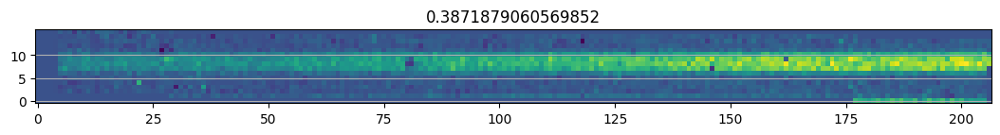

(array([], dtype=int64), array([], dtype=int64))


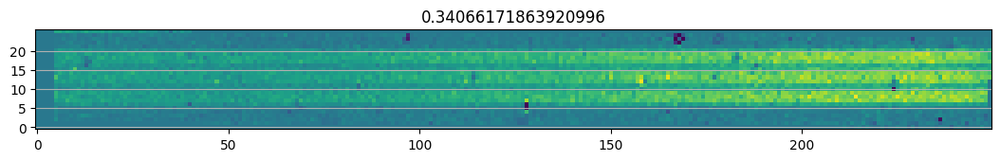

(array([], dtype=int64), array([], dtype=int64))


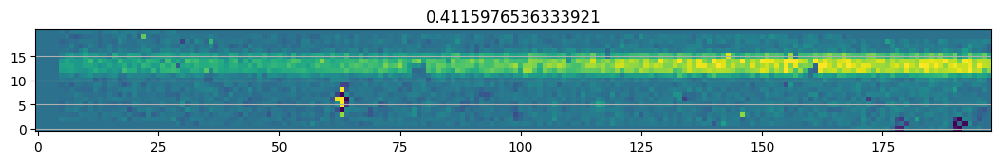

(array([], dtype=int64), array([], dtype=int64))


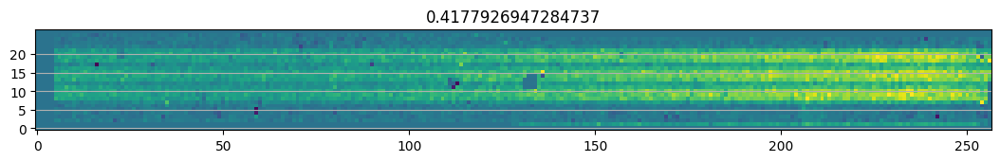

(array([], dtype=int64), array([], dtype=int64))


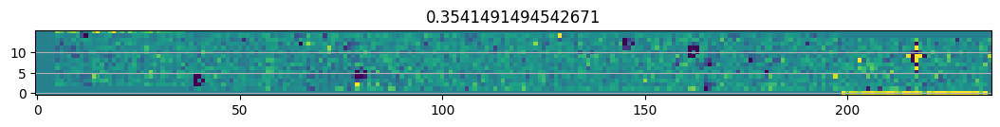

(array([], dtype=int64), array([], dtype=int64))


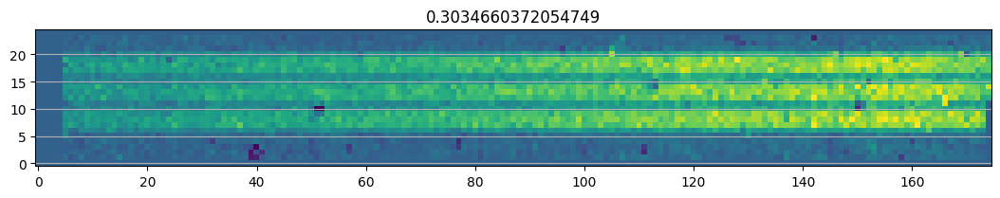

In [259]:
for slit in slits.slits:
    plt.figure(figsize=(13,5))
    z = ZScaleInterval()
    z1,z2 = z.get_limits(slit.data)
    
    data = slit.data
    print(np.where(np.isnan(slit.data)))
    data[np.isnan(data)] = 0
    Y,X = np.indices(slit.data.shape)
    ra,dec,lamb = slit.meta.wcs.transform('detector', 'world', X, Y)

    eps = 0.2 / 3600
    distance = np.sqrt((slit.source_dec-dec)**2 + (slit.source_ra-ra)**2)
    distance[np.isnan(distance)] = 1000

    mask = np.logical_and(
        np.logical_not(np.isnan(slit.wavelength)),
        distance < eps
    )
    y,x = np.where(mask)

    coeff, _ = cfit(lambda x,a,b: a*x+b , x, y)
    alpha = np.arctan(coeff[0])*180/np.pi

    rotated = rotate(data,alpha,mode='constant')
    
    
    plt.imshow(rotated,origin='lower',vmin=z1,vmax=z2)
    plt.title(alpha)
    
    
    ax = plt.gcf().gca()
    major_ticks = np.arange(0, data.shape[0], 5)

    ax.set_yticks(major_ticks)
    plt.grid(True,axis='y')
    
    plt.show()


1.9634954084936207


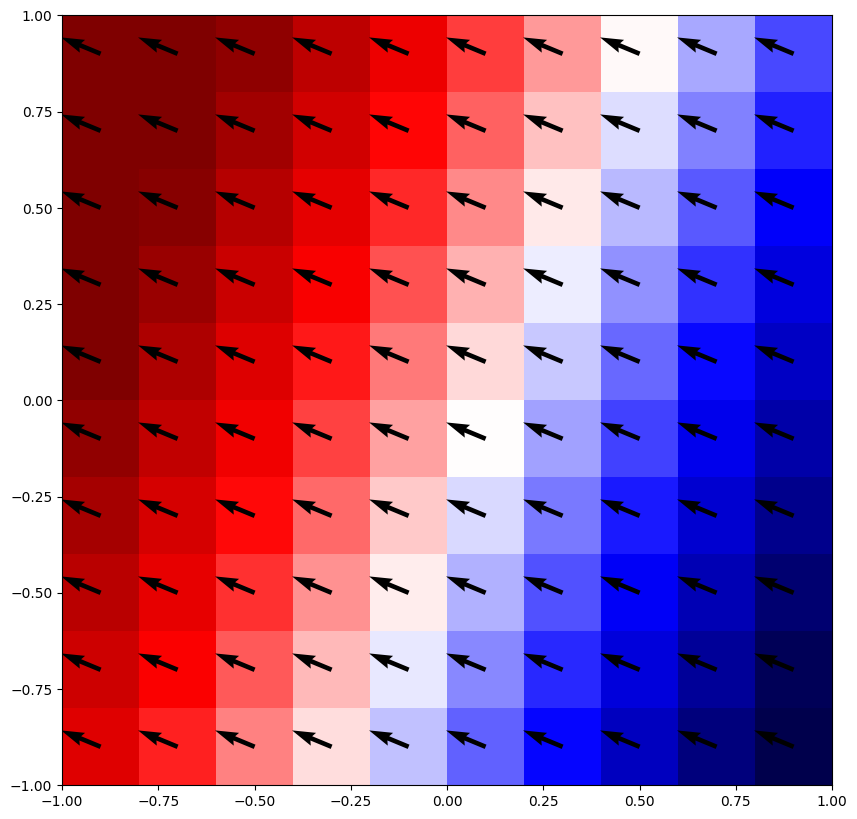

-1.963495408493621


In [108]:
x,y = np.indices((10,10),dtype=float)
x -= 5
y -= 5
x /= 5
y /= 5

theta = np.pi/8*5
print(theta)

rotato = 10*np.cos(theta)*x - 10*np.sin(theta)*y
grad = np.gradient(rotato)


U = grad[1]
V = grad[0]

plt.figure(figsize=(10,10))

plt.imshow(rotato,vmin=-10,vmax=10,cmap="seismic",extent=[-1,1,-1,1])

Q = plt.quiver(x+0.1, y+0.1, U, -V)

plt.show()

print(np.arctan2(U[0,0],V[0,0]))

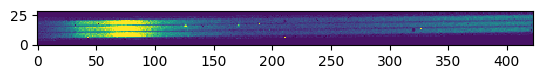

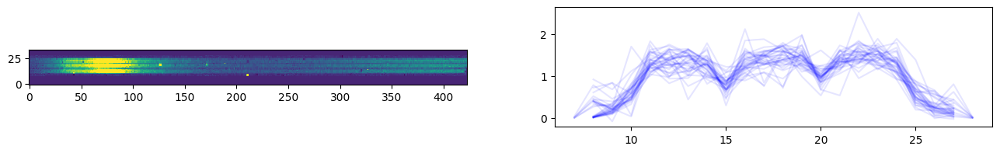

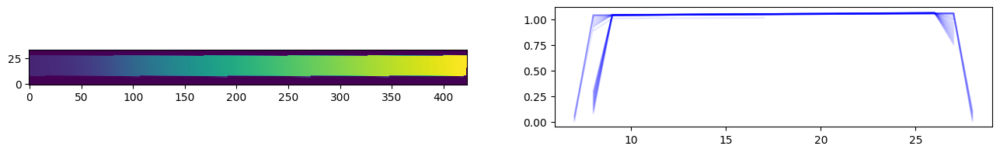

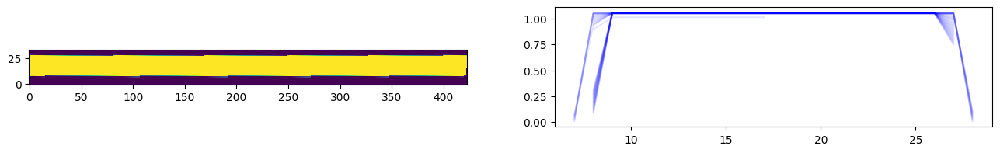

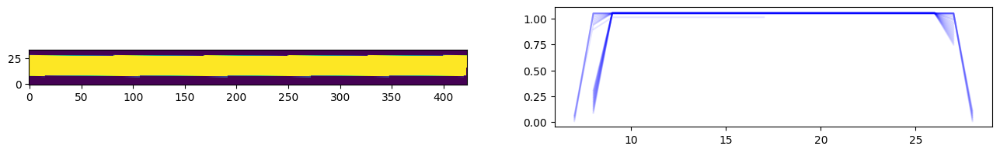

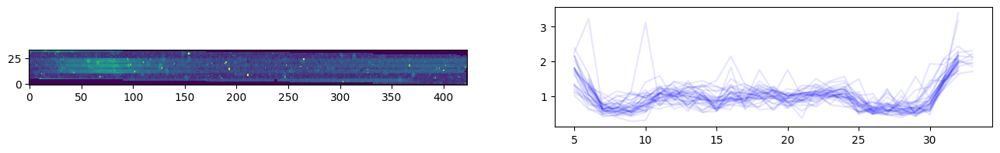

In [387]:
importlib.reload(BBSS)

slit = slits[0]

plt.figure()
z = ZScaleInterval()
z1,z2 = z.get_limits(slit.data)
plt.imshow(slit.data,origin='lower',interpolation="none",vmin=z1,vmax=z2)

rotationed = BBSS.rotateSlit(slit)
for _ in rotationed:
    z = ZScaleInterval()
    z1,z2 = z.get_limits(_)
    plt.figure(figsize=(16,2))
    plt.subplot(1,2,1)
    plt.imshow(_,origin='lower',interpolation="none",vmin=z1,vmax=z2)
    plt.subplot(1,2,2)
    _ = np.ma.masked_array(_,mask=_==0)
    horiz_sum = np.ma.mean(_,axis=1)
    maxline = np.ma.mean(_,axis=0)
    for i in range(len(horiz_sum)):
        plt.plot(_[:,i]/maxline[i],alpha=0.1,color='b')
    plt.show()

distance = np.sqrt((slit.source_dec - rotationed[3]) ** 2 + (slit.source_ra - rotationed[2]) ** 2)



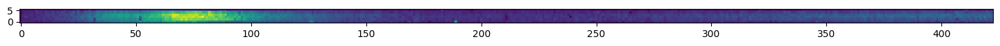

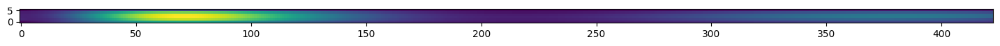

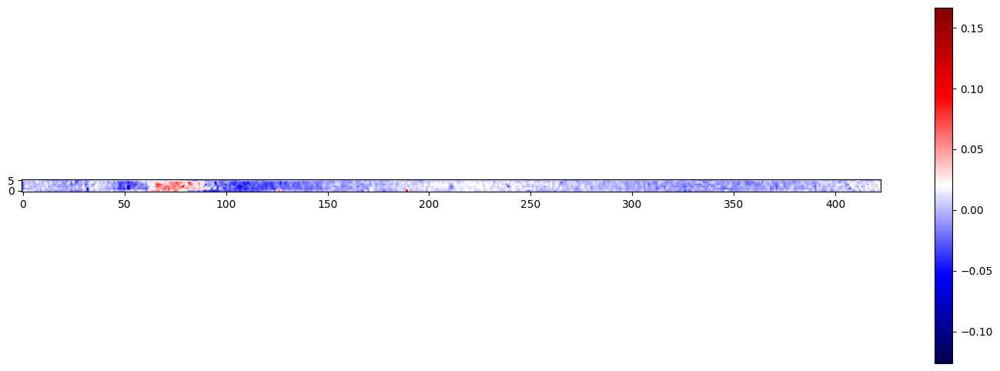

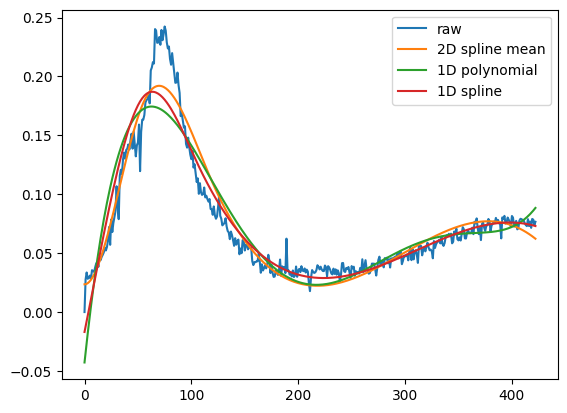

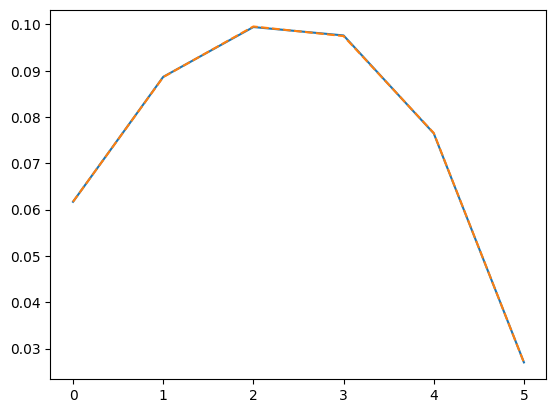

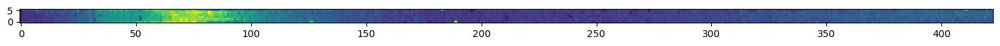

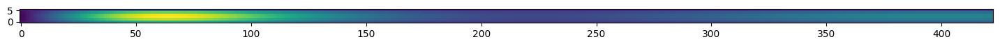

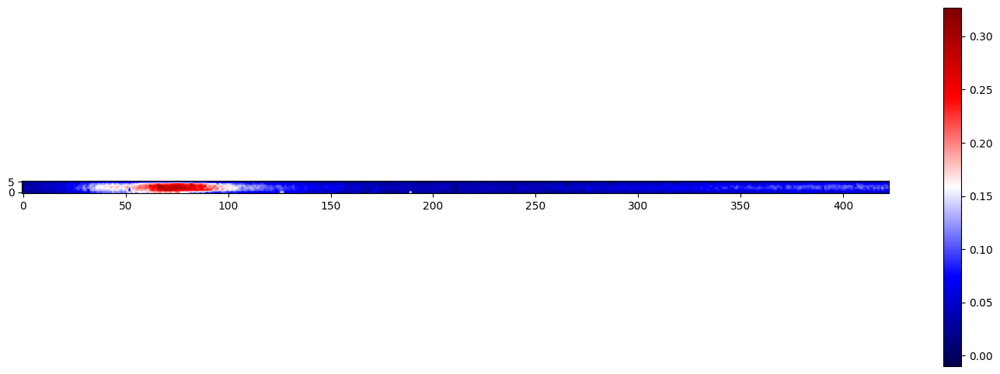

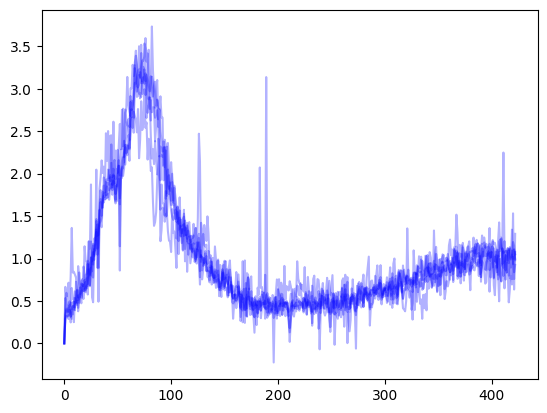

In [522]:
def Polynome(x,*coeffs):
    coeffs = np.array(coeffs)

    # repeat m times the X 2D array along 1st axis
    m = len(coeffs)
    x = x[np.newaxis, :]
    x = np.repeat(x, m, axis=0)

    # Make power series to the right shape
    power = np.arange(m)
    power = power[:, np.newaxis]

    # Take the power along the 1st axis, multiply by coeffs along the same axis, sum along the axis
    polyn = np.power(x,power)
    polyn = polyn * coeffs[:, None]
    polyn = polyn.sum(axis=0)

    return polyn


slice_indices = np.array([np.array([9,15]),np.array([15,20]),np.array([20,26])])

plt.figure(figsize=(18,6))
z = ZScaleInterval()
z1,z2 = z.get_limits(slit.data)
i = 2
bkg = rotationed[0][slice_indices[i][0]:slice_indices[i][1]]
X,Y = np.indices(bkg.shape)

x = np.arange(bkg.shape[1])
              
interp = interpolate.SmoothBivariateSpline(X.flatten(), Y.flatten(), bkg.flatten(), s=0.8)
znew = interp(X,Y,grid=False)
plt.imshow(bkg,origin="lower")

plt.figure(figsize=(18,6))
plt.imshow(znew,origin="lower")

plt.figure(figsize=(18,6))
plt.imshow(bkg-znew,origin="lower",cmap='seismic')
plt.colorbar()


plt.figure()
plt.plot(bkg.mean(axis=0),label='raw')
plt.plot(znew.mean(axis=0),label='2D spline mean')

p0 = [
    bkg.mean(), # constant shift, order 0 polynomial
    1, # order 1
    1, # order 2
    1, # order 3
    1,
    1,
    1,
]

coeff, err = cfit(Polynome,x, bkg.mean(axis=0), p0=p0)
plt.plot(Polynome(x,*coeff),label="1D polynomial")

interp = interpolate.UnivariateSpline(x,bkg.mean(axis=0),s=0.1)
plt.plot(interp(x),label='1D spline')
plt.legend()

plt.figure()
plt.plot(bkg.mean(axis=1))
plt.plot(znew.mean(axis=1),linestyle='dashed')


plt.figure(figsize=(18,6))
z = bkg / znew.mean(axis=1)[:,None]
plt.imshow(z,origin="lower")
plt.show()

plt.figure(figsize=(18,6))
spline1d = interp(Y)*znew.mean(axis=1)[:,None]
plt.imshow(spline1d,origin="lower")


plt.figure(figsize=(18,6))
plt.imshow(bkg-spline1d,origin="lower",cmap='seismic')
plt.colorbar()

plt.figure()
plt.plot(z.T,color='b',alpha=0.3)
plt.show()





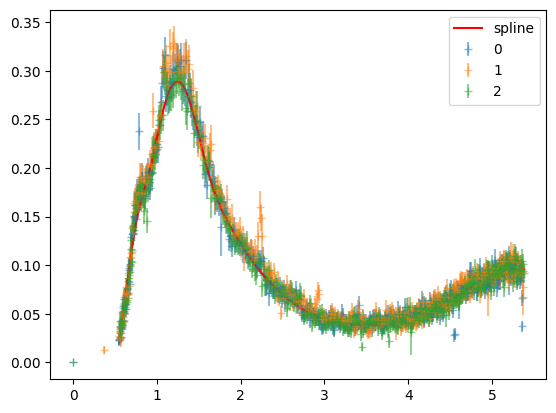

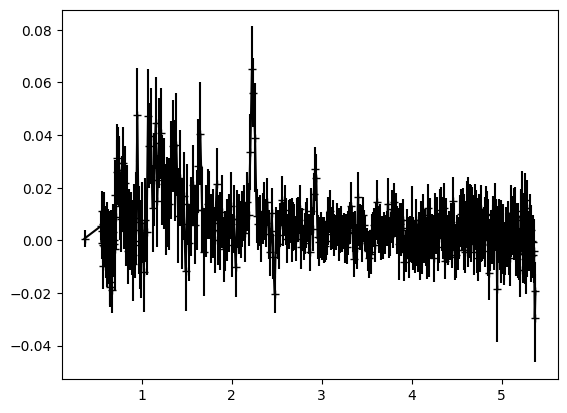

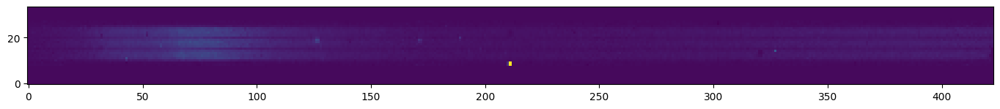

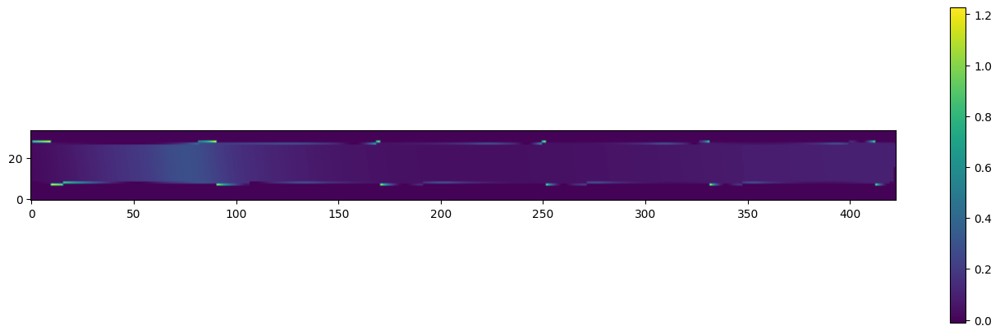

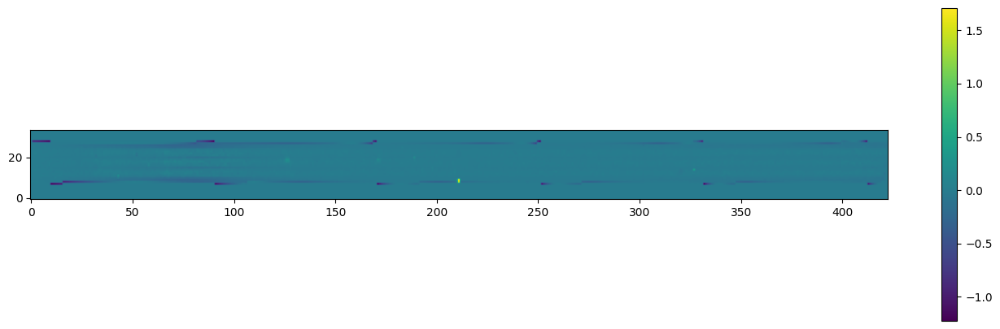

In [731]:
slice_indices = np.array([np.array([9,15]),np.array([15,20]),np.array([20,26])])
peaks = np.array([12,17,23])
plt.figure()

for i in range(3):
    bkg = rotationed[0][peaks[i]-1:peaks[i]+2]
    lamb = rotationed[1][peaks[i]-1:peaks[i]+2]
    error = rotationed[-1][peaks[i]-1:peaks[i]+2]
    plt.errorbar(lamb.mean(axis=0),bkg.mean(axis=0),alpha=0.5,yerr=np.sqrt((error**2).mean(axis=0)),label=i,marker="+",linestyle="none")
    
x = np.append(rotationed[1][peaks[i]-1:peaks[i]+2].mean(axis=0),
              rotationed[1][peaks[i]-1:peaks[i]+2].mean(axis=0))
y = np.append(rotationed[0][peaks[i]-1:peaks[i]+2].mean(axis=0),
              rotationed[0][peaks[i]-1:peaks[i]+2].mean(axis=0))
err = np.append(np.sqrt((rotationed[-1][peaks[i]-1:peaks[i]+2]**2).mean(axis=0)),
              np.sqrt((rotationed[-1][peaks[i]-1:peaks[i]+2]**2).mean(axis=0)))


y = y[x>0]
err = err[x>0]
x = x[x>0]
indices = np.argsort(x)
x = x[indices]
y = y[indices]
err = err[indices]

interp = interpolate.UnivariateSpline(x,y,s=0.05)
    
plt.plot(np.linspace(x.min(),x.max(),300),interp(np.linspace(x.min(),x.max(),300)),color='red',label='spline')
plt.legend()
plt.show()

plt.figure()
i = 1
bkg = rotationed[0][peaks[i]-1:peaks[i]+2].mean(axis=0)
lamb = rotationed[1][peaks[i]-1:peaks[i]+2].mean(axis=0)
error = rotationed[-1][peaks[i]-1:peaks[i]+2].mean(axis=0)
indices = np.argsort(lamb)
lamb = lamb[indices]
bkg = bkg[indices]
error = error[indices]
plt.errorbar(lamb,bkg-interp(lamb),yerr=error,color='k',marker='+')

    
plt.show()



plt.figure(figsize=(17,5))
plt.imshow(rotationed[0],origin='lower')
plt.figure(figsize=(17,5))
interpolated = interp(rotationed[1])
interpolated[rotationed[1] == 0] = 0
plt.imshow(interpolated,origin='lower')
plt.colorbar()
plt.figure(figsize=(17,5))
plt.imshow(rotationed[0] - interpolated,origin='lower')
plt.colorbar()
plt.show()



/tmp/ipykernel_116/3884014632.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(17,5))


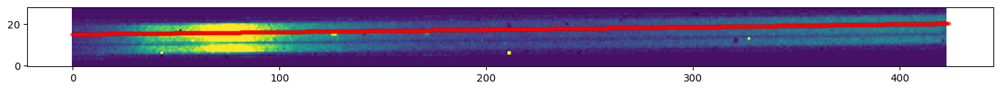

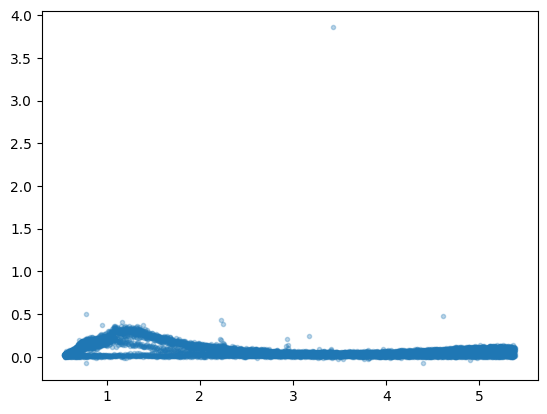

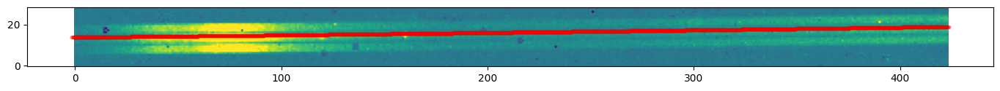

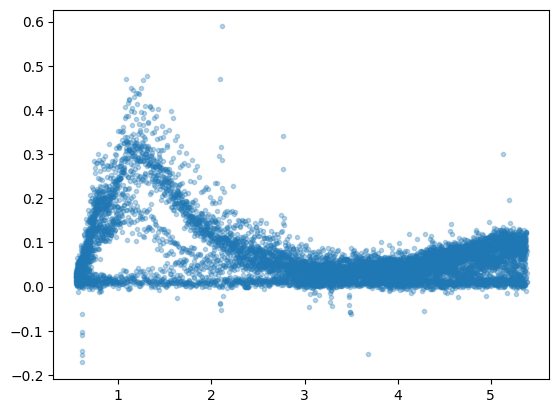

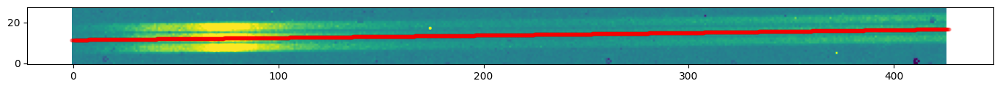

...

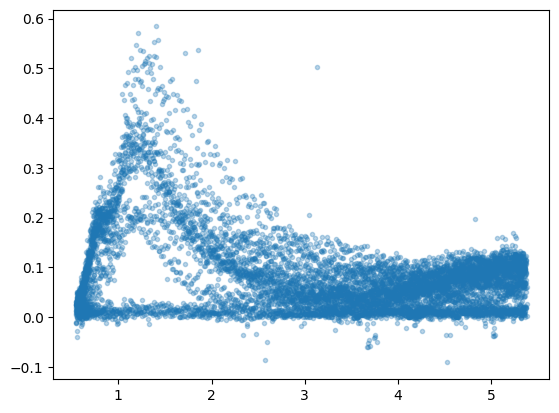

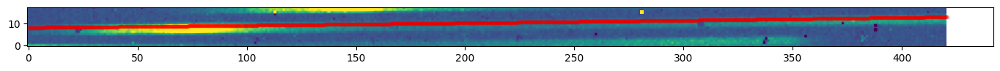

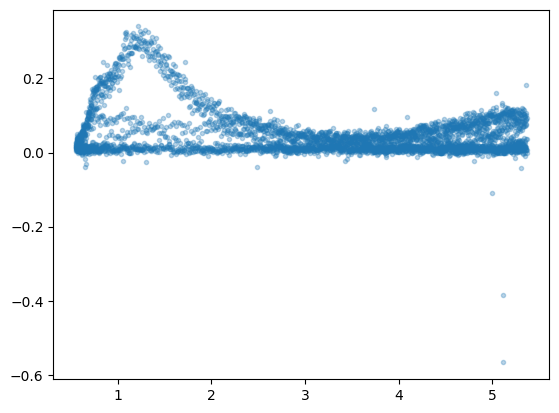

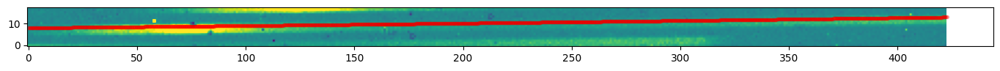

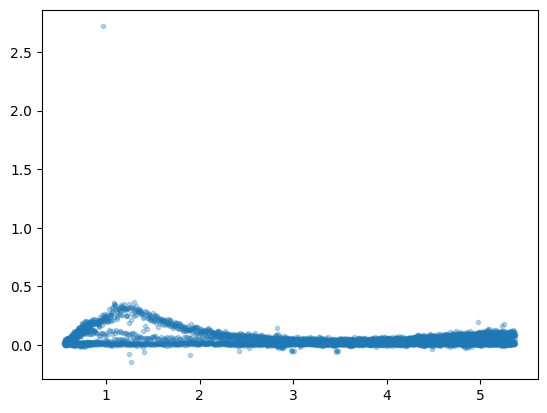

In [663]:
for i in range(20):
    slit = slits[i]
    z = ZScaleInterval()
    z1,z2 = z.get_limits(slit.data)
    data = slit.data
    Y,X = np.indices(slit.data.shape)
    ra,dec,lamb = slit.meta.wcs.transform('detector', 'world', X, Y)
    
   
    distance = np.sqrt((ra-slit.source_ra)**2)
    distance[distance > 0.5/3600] = distance[~np.isnan(distance)].max()
    distance[np.isnan(distance)] = distance[~np.isnan(distance)].max()

    x,y = slit.meta.wcs.transform('world','detector',np.ones_like(X)*slit.source_ra,np.ones_like(Y)*slit.source_dec,lamb)
    x = x.ravel()
    y = y.ravel()
    
    plt.figure(figsize=(17,5))
    plt.imshow(data,origin="lower",vmax=z2,vmin=z1)
    plt.scatter(x,y,color='r',marker='.',alpha=0.1)
    
    plt.figure()
    plt.scatter(lamb.ravel(),data.ravel(),alpha=0.3,marker=".")

In [3]:
path = working_dir + "jw01345063001_03101_00001_nrs2_srctype.fits"
slits = dm.open(path)

In [ ]:
from jwst.flatfield import FlatFieldStep
from jwst.pathloss import PathLossStep
from jwst.barshadow import BarShadowStep
from jwst.photom import PhotomStep

pre_calibrated = FlatFieldStep.call(slits)
pre_calibrated = PathLossStep.call(pre_calibrated)
pre_calibrated = BarShadowStep.call(pre_calibrated)
pre_calibrated = PhotomStep.call(pre_calibrated)

2024-05-24 14:15:47,835 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_system_datalvl_0002.rmap      694 bytes  (1 / 189 files) (0 / 703.3 K bytes)
2024-05-24 14:15:48,201 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_system_calver_0036.rmap    4.6 K bytes  (2 / 189 files) (694 / 703.3 K bytes)
2024-05-24 14:15:48,630 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_system_0035.imap             385 bytes  (3 / 189 files) (5.3 K / 703.3 K bytes)
2024-05-24 14:15:48,964 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap    1.4 K bytes  (4 / 189 files) (5.7 K / 703.3 K bytes)
2024-05-24 14:15:49,302 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nirspec_wavecorr_0005.rmap      884 bytes  (5 / 189 files) (7.1 K / 703.3 K bytes)
2024-05-24 14:15:49,628 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nirspec_superbias_0072.rmap   31.8 K bytes  (6 / 189 files) (8.0 K / 703.3 K bytes)
2024-05-24

2024-05-24 14:16:05,949 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_throughput_0005.rmap    1.3 K bytes  (50 / 189 files) (178.6 K / 703.3 K bytes)
2024-05-24 14:16:06,369 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_superbias_0028.rmap    6.5 K bytes  (51 / 189 files) (179.8 K / 703.3 K bytes)
2024-05-24 14:16:06,709 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_specwcs_0012.rmap    3.1 K bytes  (52 / 189 files) (186.3 K / 703.3 K bytes)
2024-05-24 14:16:07,049 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_spectrace_0008.rmap    2.3 K bytes  (53 / 189 files) (189.4 K / 703.3 K bytes)
2024-05-24 14:16:07,384 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_specprofile_0008.rmap    2.4 K bytes  (54 / 189 files) (191.8 K / 703.3 K bytes)
2024-05-24 14:16:07,816 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_niriss_speckernel_0006.rmap    1.0 K bytes  (55 / 189 files) (194.1 K /

2024-05-24 14:16:24,152 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (98 / 189 files) (354.8 K / 703.3 K bytes)
2024-05-24 14:16:24,587 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap    4.5 K bytes  (99 / 189 files) (356.3 K / 703.3 K bytes)
2024-05-24 14:16:24,944 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap      984 bytes  (100 / 189 files) (360.7 K / 703.3 K bytes)
2024-05-24 14:16:25,288 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (101 / 189 files) (361.7 K / 703.3 K bytes)
2024-05-24 14:16:25,682 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (102 / 189 files) (366.4 K / 703.3 K bytes)
2024-05-24 14:16:26,131 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_nircam_pars-j

2024-05-24 14:16:42,454 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_mrsptcorr_0005.rmap    2.0 K bytes  (146 / 189 files) (605.6 K / 703.3 K bytes)
2024-05-24 14:16:42,875 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_mask_0022.rmap        3.1 K bytes  (147 / 189 files) (607.6 K / 703.3 K bytes)
2024-05-24 14:16:43,203 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_linearity_0018.rmap    2.8 K bytes  (148 / 189 files) (610.7 K / 703.3 K bytes)
2024-05-24 14:16:43,531 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_ipc_0007.rmap           700 bytes  (149 / 189 files) (613.6 K / 703.3 K bytes)
2024-05-24 14:16:43,852 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_gain_0012.rmap        3.9 K bytes  (150 / 189 files) (614.3 K / 703.3 K bytes)
2024-05-24 14:16:44,275 - CRDS - INFO -  Fetching  ./crds_cache/mappings/jwst/jwst_miri_fringefreq_0003.rmap    1.4 K bytes  (151 / 189 files) (618.2 K / 703.3 K b

2024-05-24 14:17:55,228 - CRDS - INFO -  Fetching  ./crds_cache/references/jwst/nirspec/jwst_nirspec_sflat_0202.fits  336.6 M bytes  (1 / 1 files) (0 / 336.6 M bytes)
2024-05-24 14:25:47,634 - CRDS - INFO -  Fetching  ./crds_cache/references/jwst/nirspec/jwst_nirspec_dflat_0002.fits  688.9 M bytes  (1 / 1 files) (0 / 688.9 M bytes)
